# Homework 2

In this homework we explore the autoencoder framework and its performances. In the first part of the notebook we implement the same autoencoder seen in the lab lectures with some small modifications. <br>

We later build a different autoencoder and tune its parameters through random search. As we have done in the second part of homework 1 we built a validation set to perform the search, after inspecting its performances we try to act on the latent space through PCA, ICA and t-SNE.<br>

In the last 2 sections we first fine tune the encoder as a classifier comparing its performances with the one developed in homework 1, then we develop a DC-GAN that should be able to generate sample from a randomly generated latent space vector of fixed length.

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.model_selection import KFold
import seaborn as sns
import torch.utils.data as data
from typing import OrderedDict
import random
import os
import matplotlib.image as mpimg
import plotly.express as px
import glob
import re
import time
from sklearn.decomposition import PCA
import json
from sklearn.decomposition import FastICA
import matplotlib.patches as mpatches
import json
from __future__ import print_function
import argparse
import os
import matplotlib.animation as animation
from IPython.display import HTML

## Autoencoder implementation


In this first section, we implement the autoencoder seen in the lab lectures. The first choice we make is to use the Fashion-MNIST dataset, this will allow us to better compare the fine-tuned network we will implement, in one of the later parts of this notebook, to the classifier developed and fine tuned in homework 1.<br>

The first change we make from the lab's network is to make the latent space a fixed-length vector of size 3 instead of 2 in order to have more representational power but still have the opportunity to represent the latent space without using some dimensionality reduction technique. <br>
Moreover, regarding the hyper-parameters of the encoder, instead of using the lab ones, we decided to make use of the results of the homework 1's grid search utilizing the hyper-paramters found there.

Setting the random seeds all at once 

In [23]:
# set all the seeds at once
torch.manual_seed(123)
random.seed(123)
np.random.seed(1)

In [8]:
train_dataset = torchvision.datasets.FashionMNIST('Mnist_dataset', train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST('Mnist_dataset', train=False, download=True)

In [9]:
label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']

Sample at index 12
Label: sandal


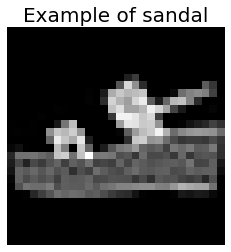

In [10]:
index = 12
image, label = train_dataset[index]
print(f"Sample at index {index}")
print(f"Label: {label_names[label]}")
plt.imshow(image, cmap='gray')
plt.title(f'Example of {label_names[label]}', fontsize = 20)
plt.axis('off')

plt.show()

## Data transformation

In homework 1 what we did was to apply some transformations to all the training data, here we adopt another tecnhnique. This time we randomly take half of our training set and apply all the transformations to it, then we concatenate the original training dataset to this new set that we will call augmentation dataset. We will use the concatenation as the final training set.<br>
Instead of applying the transformations to part of the training set we could have used the    `transforms.RandomApply()` function of *Pytorch* that applyies a set of transformations randomly with a given probability to the data.<br>

Another *Pytorch* tool we could have exploited are the automatic augmentation routines that *Pytorch* provides, we chose however to implement the transformations manually, a little bit to better tune them specifically to our type of images, a little bit also for the sake of the exercise not to make things too automatic.

Hopefully this transformations will not only help us avoid overfitting but it will also get us a chance to make the latent space smoother not having some sparse crossover between different classes.

The transformations applied to the augmentation dataset are:

- RandomRotation: Chooses an angle in the given range and rotates the image by that angle.

- RandomResizedCrop: Crops the images and resizes it in order to return an image with the original dimensions.

- RandomVerticalFlip: Flips vertically the image with a given probability.

- RandomHorizontalFlip: Flips horizontally the image with a given probability.

- RandomInvert: Inverts the colors of the given image randomly with a given probability.

- ToTensor: Transforms the image to a PyTorch tensor.

- rand_noise: User defined class that applyies noise to the image. The noise is sampled from a rescaled Gaussian with mean 0 and variance 1.

As far as the test dataset is concerned, we just transform the image to a tensor.


In [11]:
class rand_noise(object):
        
    def __call__(self, image):
        self.random = torch.rand_like(torch.tensor(np.zeros((28, 28))))
        return image + self.random/5

In [12]:
test_trans = transforms.Compose([
        transforms.ToTensor(), # Convert to tensor
        ])

In [13]:
# Train transformation pipeline

aug_trans = transforms.Compose([
         
        transforms.RandomRotation([-45, 45]),
        
        transforms.RandomResizedCrop(size = 28, scale=(0.9, 1)),
        transforms.RandomVerticalFlip(p=0.3),
        transforms.RandomHorizontalFlip(p=0.3),
        transforms.RandomInvert(p=0.3),
        
        transforms.ToTensor(),
        rand_noise()
        
        ])

### Showing the transformations

In the following cell we show all the transformation we apply to the augmentation dataset.

Original image shape: (28, 28)
transformed shape: torch.Size([1, 28, 28])
Original


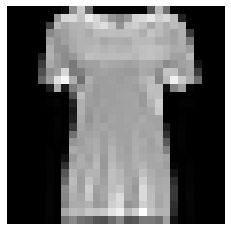

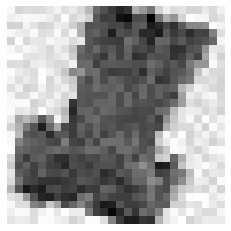

In [14]:
original_image = train_dataset[10][0]
transformed_image = aug_trans(original_image)
print(f"Original image shape: {np.array(original_image).shape}")
print(f"transformed shape: {transformed_image.shape}")
#print(transformed_image)

# Plot original image
print('Original')
plt.imshow(original_image, cmap='gray')
plt.axis('off')
plt.show()

# Plot transformed image

plt.imshow(transformed_image.permute([1,2,0]), cmap='gray')
plt.axis('off')
plt.show()

In [10]:
class DatasetFromSubset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x.float(), y

    def __len__(self):
        return len(self.subset)

In [11]:
train_set_size = int(len(train_dataset) * 0.8)
validation_set_size = len(train_dataset) - train_set_size
train_dataset, validation_set = data.random_split(train_dataset, [train_set_size, validation_set_size],\
    generator=torch.Generator().manual_seed(123))

In [12]:
aug_idx = random.sample(range(train_set_size), k = int((train_set_size)*0.5)) #samples without replacement
aug_dataset = torch.utils.data.Subset(train_dataset, aug_idx)

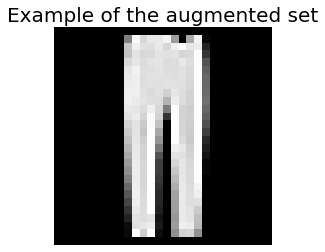

In [13]:
plt.imshow(aug_dataset[10][0], cmap='gray')
plt.title('Example of the augmented set', fontsize = 20)
plt.axis('off')
plt.show()

In [14]:
# Redefine the datasets with the proper transform       


train_dataset  = DatasetFromSubset(
    train_dataset, transform=test_trans)
validation_set  = DatasetFromSubset(
    validation_set, transform=test_trans)
test_dataset.transform  = test_trans
aug_dataset = DatasetFromSubset(
    aug_dataset, transform=aug_trans
)

Here, as explained before we concatenate the augmented dataset with the original training set.

In [15]:
# Final training set obtaines by concatenating the training and the augmented dataset
final_train = torch.utils.data.ConcatDataset([train_dataset, aug_dataset])

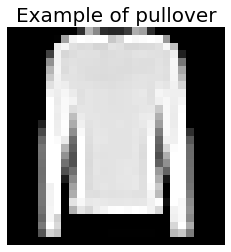

In [16]:
# Look at a training sample
image, label = next(iter(final_train))
plt.imshow(image.squeeze(), cmap='gray')
plt.title(f'Example of {label_names[label]}', fontsize = 20)
plt.axis('off')
plt.show()

### Dataloader

In the following cell we define the 3 DataLoader objects, as far as the batch size we keep the same one used in the lab lecture.

In [16]:
# Here we implement the autoencoder of the lab with a little more powerful latent space, having 3
# variables

train_dataloader = DataLoader(final_train, batch_size=256, shuffle=True)

test_dataloader = DataLoader(test_dataset, batch_size=256, shuffle=False)

valid_dataloader = DataLoader(validation_set, batch_size=256, shuffle=False)


batch_data, batch_labels = next(iter(train_dataloader))
print(f"Train batch shape")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"Test batch shape")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")


batch_data, batch_labels = next(iter(valid_dataloader))
print(f"Validation batch shape")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

Train batch shape
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])
Test batch shape
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])
Validation batch shape
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])


## Encoder and Decoder

We define here the encoder and the decoder architectures as implemented in the lab, also here we keep the definition as a function of the latent space dimension, as already said this will allow us to set the latent space as a 3 dimensional vector. <br>

The encoder is made of 3 convolutional layers with a **ReLU** activation function in between, the last convolutional layer is then flattened before implementing a 2 layer standard feed-forward network with **ReLU** as the activation function.<br>
As already mentioned we will exploit the results of the hyper-parameters tuned in homework 1 to set the values of our parameters.

The decoder is built to be a mirrored version of the encoder, having `ConvTranspose2d` layers instead of the convolutional ones.

In [17]:
# encoder
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            # First convolutional layer
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=(3, 3), 
                      stride=2, padding=1),
            nn.ReLU(),
            # Second convolutional layer
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3, 3), 
                      stride=2, padding=1),
            nn.ReLU(),
            # Third convolutional layer
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3, 3), 
                      stride=2, padding=0),
            nn.ReLU()
        )
        
        # Flatten layer
        self.flatten = nn.Flatten(start_dim=1) # We exclude the batch size here starting from 1

        # Linear section
        self.encoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(in_features=288, out_features=64),
            nn.ReLU(),
            # Second linear layer
            nn.Linear(in_features=64, out_features=encoded_space_dim)
        )
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.encoder_lin(x)
        return x

In [18]:
# Decoder
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()

        # Linear section
        self.decoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(in_features=encoded_space_dim, out_features=64),
            nn.ReLU(True),
            # Second linear layer
            nn.Linear(in_features=64, out_features=288),
            nn.ReLU(True)
        )

        # Unflatten
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        # Convolutional section
        self.decoder_conv = nn.Sequential(
            # First transposed convolution
            nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=(3, 3), 
                               stride=2, output_padding=0),
            nn.ReLU(True),
            # Second transposed convolution
            nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=(3, 3), 
                               stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            # Third transposed convolution
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=(3, 3), 
                               stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        # Unflatten
        x = self.unflatten(x)
        # Apply transposed convolutions
        x = self.decoder_conv(x)
        # Apply a sigmoid to force the output to be between 0 and 1 (valid pixel values)
        x = torch.sigmoid(x)
        return x

In [155]:

# Initialize the two networks
# We choose an higher encoded space dimension
encoded_space_dim = 3
encoder = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)

In [162]:
# Example

img, _ = test_dataset[0] 
img = img.unsqueeze(0) 
print('Original image shape:', img.shape)
# Encode the image
img_enc = encoder(img)
print('Encoded image shape:', img_enc.shape)
# Decode the image
dec_img = decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

Original image shape: torch.Size([1, 1, 28, 28])
Encoded image shape: torch.Size([1, 3])
Decoded image shape: torch.Size([1, 1, 28, 28])


### Grid search results and loss function

We now import in a *Pandas* dataframe the top parameters of the classifier trained in homework 1.

We choose the standard reconstruction loss as our function to minimize.

In [163]:
# Best results found in the cross validation
cv_results = pd.read_csv('../homework_1/Comparison_conv.csv')
cv_results.head(1)

,Optimizers,Activation,Architecture,weight_decay,Learning_rate,Losses
0,Adam,ReLU,Wide_stride,weight_decay=0.0001,learning_rate=0.0001,0.766527


### Optimizer

We use **Adam** as an optimizer and, as done in the lab, we mantain the same optimizer for both the encoder and the decoder. The latter feature will be better investigated in the random search were we will test models both with a single optimizers and with separate optimizers: one for the encoder and one for the decoder.

In [164]:
# We define the best parameters found from our cross validation
loss_fn = torch.nn.MSELoss()


lr = 0.0001
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=0.0001)


### Train and test epoch

Below we defined the training and test error functions that are the ones that will be used inside the training loop.

In [165]:
### Training function
def train_epoch(encoder, decoder, dataloader, loss_fn, optimizer):
    
    encoder.train()
    decoder.train()
    
    conc_out = []
    conc_label = []
    
    for image_batch, _ in dataloader: 
    
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        conc_out.append(decoded_data) # We are storing basically the predicted image
        conc_label.append(image_batch)
        print('\t partial train loss (single batch): %f' % (loss.data))
        
    conc_out = torch.cat(conc_out)
    conc_label = torch.cat(conc_label)

    train_loss = loss_fn(conc_out, conc_label)

    return train_loss.data  
        

In [166]:
# Testing function
def test_epoch(encoder, decoder, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): 
        
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            
            image_batch = image_batch
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            
            conc_out.append(decoded_data) 
            conc_label.append(image_batch)
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

## Training loop and Results

The cell below is where the training loop is defined, the net sees the whole training dataset for a total amount of 20 times.<br> 
At the end of each training epoch we save an example of reconstruction of a random sample in order to show the improvements of the network step by step.

We obtain a validation loss of $0.03$, from the training and validation loss progression we notice that the curves are relatively stable. Moreover, interestingly, the test loss constantly stays below the the training loss, suggesting that we are not suffering from overfitting and that the transformations on the data and the regularization term added to the loss did their job.

In [167]:
### Training cycle
num_epochs = 20
train_losses = []
val_losses = []
for epoch in range(num_epochs):
    print('Epoch %d/%d' % (epoch + 1, num_epochs))
    # Training (use the training function)
    train_loss = train_epoch(
        encoder=encoder, 
        decoder=decoder, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)

    print('\n\n\t Training - epoch %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, train_loss))
    # Validation  (use the testing function)
    val_loss = test_epoch(
        encoder=encoder, 
        decoder=decoder,  
        dataloader=test_dataloader, 
        loss_fn=loss_fn)
    # Print Validationloss
    print('\n\n\t Validation - epoch %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
    

    train_losses.append(train_loss)
    val_losses.append(val_loss)

     # Plot progress
    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    axs[0].imshow(img.squeeze().numpy(), cmap='gist_gray')
    axs[0].set_title('Original image')
    axs[1].imshow(rec_img.squeeze().numpy(), cmap='gist_gray')
    axs[1].set_title('Reconstructed image (epoch %d)' % (epoch + 1))
    plt.tight_layout()
    plt.pause(0.1)
    # Save figures
    os.makedirs('autoencoder_init_progress_%d_features' % encoded_space_dim, exist_ok=True)
    fig.savefig('autoencoder_init_progress_%d_features/epoch_%d.jpg' % (encoded_space_dim, epoch + 1))
    plt.show()
    plt.close()

    # Save network parameters
    torch.save(encoder.state_dict(), 'encoder_init_params.pth')
    torch.save(decoder.state_dict(), 'decoder_init_params.pth')
    

Epoch 1/20
	 partial train loss (single batch): 0.158356
	 partial train loss (single batch): 0.154023
	 partial train loss (single batch): 0.161054
	 partial train loss (single batch): 0.162883
	 partial train loss (single batch): 0.156036
	 partial train loss (single batch): 0.160350
	 partial train loss (single batch): 0.157828
	 partial train loss (single batch): 0.159116
	 partial train loss (single batch): 0.159760
	 partial train loss (single batch): 0.159169
	 partial train loss (single batch): 0.161883
	 partial train loss (single batch): 0.157353
	 partial train loss (single batch): 0.162220
	 partial train loss (single batch): 0.160644
	 partial train loss (single batch): 0.159505
	 partial train loss (single batch): 0.157847
	 partial train loss (single batch): 0.158150
	 partial train loss (single batch): 0.162411
	 partial train loss (single batch): 0.164615
	 partial train loss (single batch): 0.160213
	 partial train loss (single batch): 0.158162
	 partial train loss (s

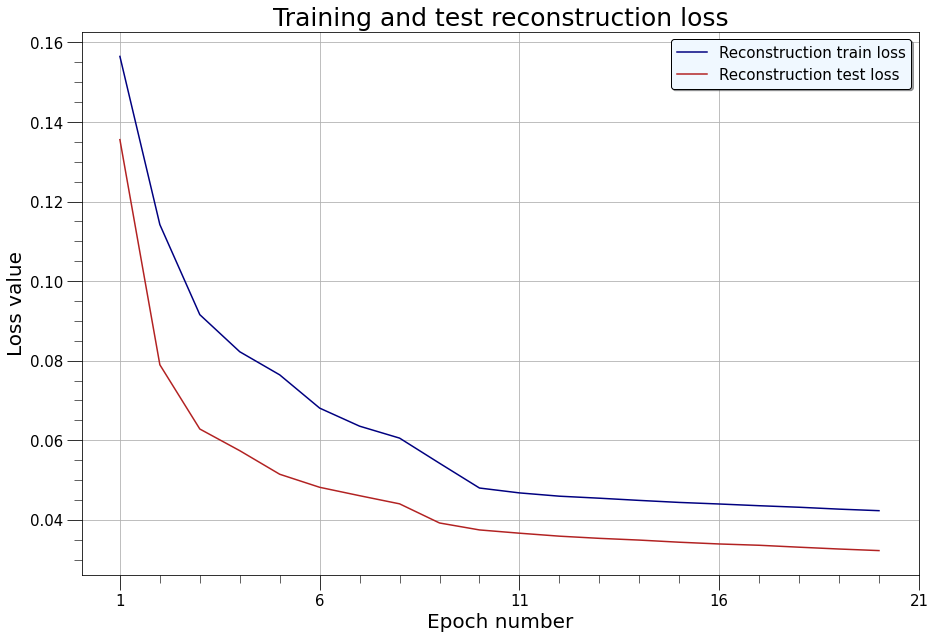

In [205]:
fig, ax = plt.subplots(1, 1, figsize = (15, 10))
ax.plot(range(len(train_losses)), list(map(lambda x:x.numpy(), train_losses)), zorder = 3, label='Reconstruction train loss',\
    color='navy')
ax.plot(range(len(val_losses)), list(map(lambda x:x.numpy(), val_losses)), zorder = 3, label='Reconstruction test loss',\
    color = 'firebrick')
ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.minorticks_on()
ax.grid(zorder = 1)
ax.legend(facecolor='aliceblue', shadow = True, edgecolor='black', fontsize = 15)
ax.set_title('Training and test reconstruction loss', fontsize = 25)
ax.set_xticks(np.arange(21)[::5])
ax.set_xticklabels(np.arange(21)[::5] + 1)
ax.set_xlabel('Epoch number', fontsize = 20)
ax.set_ylabel('Loss value', fontsize = 20)
plt.show()

### Reconstruction progression

Below we show the reconstruction that the network is able to perform after each epoch. <br>
We can see at the beginning how the 28x28 image is basically white noise then, little by little, the net learns how to properly reconstruct the image up to reaching a nice level of accuracy.

In [87]:
images = glob.glob('./autoencoder_init_progress_3_features/*')
img_idx = [int(item[0]) for item in list(map(lambda x: re.findall('[0-9][0-9]*', x[-9:]), images))]
#img_idx
sort_img_idx = np.argsort(img_idx)
images = np.array(images)[np.array(sort_img_idx)]

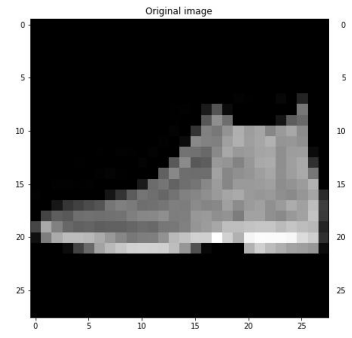

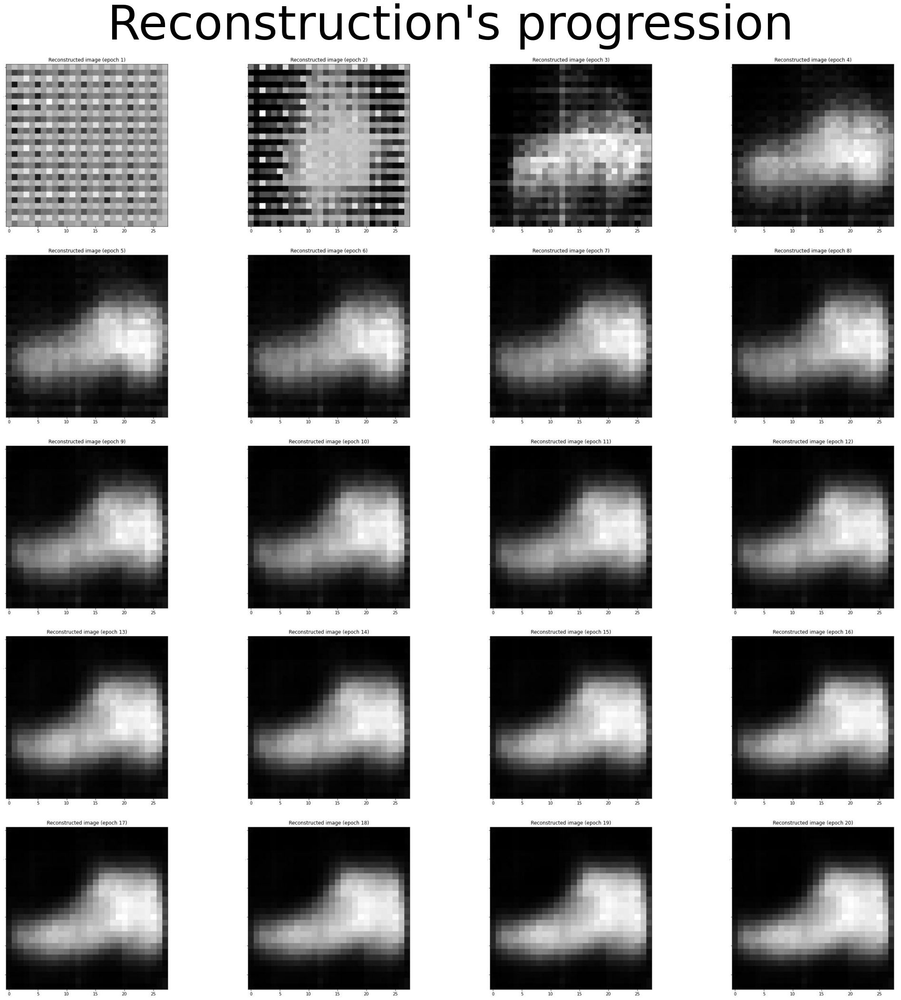

In [88]:
fig1, ax1 = plt.subplots(1, 1, figsize = (5, 5))
fig, axs = plt.subplots(5, 4, figsize = (30, 30))
ax1.imshow(mpimg.imread(images[0]))
ax1.set_xlim(right = 450)
ax1.axis('off')
for image, ax in zip(images, axs.flatten()):
    img = mpimg.imread(image)
    imgplot = ax.imshow(img)
    ax.set_xlim(left = 450)
    ax.axis('off')
fig.suptitle('Reconstruction\'s progression', fontsize = 100)

fig1.tight_layout()
fig.tight_layout(pad = 3)


In [16]:
# Load network parameters
encoder.load_state_dict(torch.load('encoder_init_params.pth'))
decoder.load_state_dict(torch.load('decoder_init_params.pth'))

## Latent space representation

We have built our network to have a dimension 3 vector as the latent space. Now we visualize the latent space on a 3 dimensional axis. <br>
What we can see is that classes are clustered toegether pretty nicely and it seemes like the output is smooth inside the ellipsoid-like shape we obtained and there are not big gaps between each class.<br>
Furthermore another nice feature is that, if we consider each class independently, it seems like that they are fairly clustered toegether and are not sparse along the whole domain.<br>

The spatial position of each class is also an encouraging feature as we can notice how the boot cluster is close to the sandal cluster while for example the same boot cluster is far from the dress cluster.

In [17]:
# Get the encoded representation of the test samples
encoded_samples = []
for sample in test_dataset:
    img = sample[0].unsqueeze(0)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().numpy()
    encoded_sample = {f"Variable_{i+1}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

In [18]:
encoed_df = pd.DataFrame(encoded_samples)
encoed_df['Label_name'] = encoed_df.apply(lambda x: label_names[int(x.label)], axis = 1)
encoed_df.head()

In [116]:
fig = px.scatter_3d(encoed_df, x='Variable_1', y='Variable_2', z='Variable_3',
              color='Label_name', title=  'Latent space',labels={
                     "Variable_1": "Variable 1",
                     "Variable_2": "Variable 2",
                     "Variable_3": "Variable 3"
                 },)

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    legend_title_font_color="green",
    
    title={
        'text': "Latent space",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig['layout']['title']['font'] = dict(size=25)

fig.show()

## Image reconstruction

In this section we exploit the hoover feature of Plotly to approximately draw latent space's samples from each class. We then pass each sample through the decoder to obtain the reconstructed image: 1 for each class. <br>

Analyzing the results we can be fairly satisfied with the results as, for most of the classes, the reconstructed sample make the class recognizable.

In [148]:
encoded_samples = dict(
encoded_t_shirt = [-41, 4, -28],
encoded_boot = [52.7, -55.8, -0.57],
encoded_bag = [38,-22,-55],
encoded_dress =[-11.6, 48,-64],
encoded_sneaker = [69,-4.6, -16.7],
encoded_sandal = [23.5, -15, 17.5],
encoded_coat = [-0.4, 14.6, -83],
encoded_shirt = [-28.3, 32.3,-84.8],
encoded_trouser = [-25.38, 40.86, -32.54] ,
encoded_pullover = [-19.2, -19.8, -70])

labels = list(map(lambda x: re.findall('_[a-z]_*[a-z]+',x)[0].replace('_',''), list(encoded_samples.keys())))


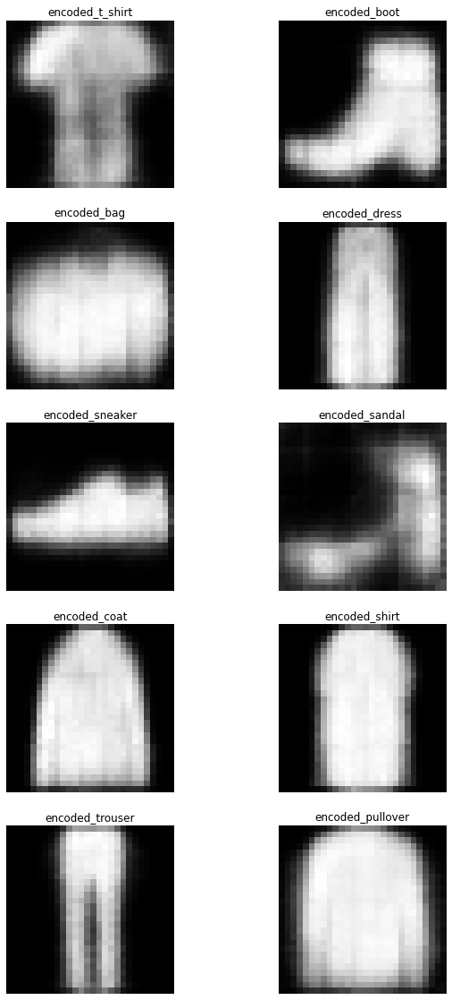

In [149]:
# We take a sample for each encoded class


fig, axs = plt.subplots(5, 2, figsize = (10, 20))
for i, ax in enumerate(axs.flatten()):
    encoded_value = torch.tensor(list(encoded_samples.values())[i]).float().unsqueeze(0)

    # Decode sample
    decoder.eval()
    with torch.no_grad():
        generated_img  = decoder(encoded_value)

    
    ax.imshow(generated_img.squeeze().numpy(), cmap='gist_gray')
    ax.set_title(list(encoded_samples.keys())[i])
    ax.axis('off')
   

## Parameter tuning

In the next section we will use the validation dataset defined above to perform, instead of the grid search performed in **homework 1**, a random search in the hyper-parameter space. <br>

We don't test different types of architectures because we want to keep it identical to the homework 1's classifier in order to then better fine tune the encoder to see its performances as a classifier.

The choice of the parameters is done by randomly sampling from a unifrom distribution with given ranges.

The parameters tested are:

- Batch size: We randomly sample 2 batch sizes to try in the range `[10-500]`

- Weight decay: We choose a **L2** regularization, the weight decay values tested are 3 values sampled from a uniform distribution having as a range `[1e-4, 1e-6]`

- Learning rate: We try 3 learning rate parameters of the optimizer from the range `[1e-3, 1e-5]`


Outside of the random search framework we put in the loop other 2 set of parameters:<br>
first we wanna see how the performance of the autoencoder varyies as the latent space dimension increases. Intuitively the performance should improve as the encoded space dimension increases, we want to quantify this.<br>

The last thing we look for is if implementing a single shared optimizer for both the encoder and the decoder or having two independent ones will make any difference.

In [24]:
lr_range = [1e-3, 1e-5]
weight_decay__range = [1e-4, 1e-6]
batch_size_range = [10, 500]
batch_sizes = np.random.uniform(low = batch_size_range[0], high = batch_size_range[1], size = 3).astype(int)
learning_rates = np.random.uniform(low = lr_range[0], high = lr_range[1], size = 3)
weight_decays = np.random.uniform(low = weight_decay__range[0], high = weight_decay__range[1], size = 3)
print('Values given by the random search:')
comparison_df = pd.DataFrame({'Batch_sizes': batch_sizes, 'learning_rates':learning_rates, 'weight_decays':weight_decays})
comparison_df.iloc[2, 0]  = np.nan
display(comparison_df)

Values given by the random search:


,Batch_sizes,learning_rates,weight_decays
0,214.0,0.000701,0.000082
1,362.0,0.000855,0.000066
2,NaN,0.000909,0.000061


In [19]:
loss_fn = torch.nn.MSELoss()
endoded_dim = [7, 8, 9]
optimizers = ['Common', 'Separate']

### Validation training and testing epoch

In order to apply our random search we define an additional training and validation epoch function. <br>Each method will be tested for 6 epochs.

In [18]:
### Training function
def train_epoch_valid(encoder, decoder, dataloader, loss_fn, optimizer_kind, lr, weight_decay):
    if optimizer_kind == 'Common':
            params_to_optimize = [
            {'params': encoder.parameters()},
            {'params': decoder.parameters()}
            ]
            optimizer = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=weight_decay)

    elif optimizer_kind == 'Separate':
        optimizer_enc = torch.optim.Adam(encoder.parameters(), lr=lr, weight_decay=weight_decay)
        optimizer_dec = torch.optim.Adam(decoder.parameters(), lr=lr, weight_decay=weight_decay)
    
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    conc_out = []
    conc_label = []
    
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        
        image_batch = image_batch
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        if optimizer_kind == 'Common':
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        elif optimizer_kind == 'Separate':
            optimizer_enc.zero_grad()
            optimizer_dec.zero_grad()
            loss.backward()
            optimizer_enc.step()
            optimizer_dec.step()

        conc_out.append(decoded_data) # We are storing basically the predicted image
        conc_label.append(image_batch)
        print('\t partial train loss (single batch): %f' % (loss.data))
        
    conc_out = torch.cat(conc_out)
    conc_label = torch.cat(conc_label)

    train_loss = loss_fn(conc_out, conc_label)

    return train_loss.data  
        

In [19]:
### Testing function
def test_epoch_valid(encoder, decoder, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            
            image_batch = image_batch
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data) # We are storing basically the predicted image
            conc_label.append(image_batch)
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [20]:
num_epochs = 6
train_losses = {}
val_losses = {}

In [27]:
for batch_size in batch_sizes:
    for optimizer in optimizers:
        for weight_decay in weight_decays:
            for enc_dim in endoded_dim:
                for lr in learning_rates:
                    
                        print((batch_size, optimizer, weight_decay, enc_dim, lr))
                        train_losses[(batch_size, optimizer, weight_decay, enc_dim, lr)] = {}
                        val_losses[(batch_size, optimizer, weight_decay, enc_dim, lr)] = {}

                        train_tuning_dataloader = DataLoader(final_train, int(batch_size), shuffle=True)

                        valid_tuning_dataloader = DataLoader(validation_set, int(batch_size), shuffle=False)

                        encoder_valid = Encoder(encoded_space_dim=enc_dim)
                        decoder_valid = Decoder(encoded_space_dim=enc_dim)

                        for epoch in range(num_epochs):
                            train_losses[(batch_size, optimizer, weight_decay, enc_dim, lr)][f'epoch_{epoch}'] = []
                            val_losses[(batch_size, optimizer, weight_decay, enc_dim, lr)][f'epoch_{epoch}'] = []

                            print('Epoch %d/%d' % (epoch + 1, num_epochs))
                            # Training (use the training function)
                            train_loss = train_epoch_valid(
                                encoder=encoder_valid, 
                                decoder=decoder_valid, 
                                dataloader=train_tuning_dataloader, 
                                optimizer_kind=optimizer,
                                lr = lr,
                                weight_decay=weight_decay,
                                loss_fn=loss_fn)

                            print('\n\n\t Training - epoch %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, train_loss))
                            # Validation  (use the testing function)
                            val_loss = test_epoch_valid(
                                encoder=encoder_valid, 
                                decoder=decoder_valid,  
                                dataloader=valid_tuning_dataloader, 
                                loss_fn=loss_fn)
                            # Print Validationloss
                            print('\n\n\t Validation - epoch %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
                            
                            train_losses[(batch_size, optimizer, weight_decay, enc_dim, lr)][f'epoch_{epoch}'].append(train_loss)
                            val_losses[(batch_size, optimizer, weight_decay, enc_dim, lr)][f'epoch_{epoch}'].append(val_loss)
                            

                            

(10, 'Common', 8.156023907361058e-05, 7, 0.0007006907530944786)
Epoch 1/6
	 partial train loss (single batch): 0.137797
	 partial train loss (single batch): 0.139511
	 partial train loss (single batch): 0.154221
	 partial train loss (single batch): 0.130574
	 partial train loss (single batch): 0.130687
	 partial train loss (single batch): 0.163415
	 partial train loss (single batch): 0.175495
	 partial train loss (single batch): 0.164687
	 partial train loss (single batch): 0.128332
	 partial train loss (single batch): 0.126678
	 partial train loss (single batch): 0.136153
	 partial train loss (single batch): 0.210674
	 partial train loss (single batch): 0.145272
	 partial train loss (single batch): 0.145683
	 partial train loss (single batch): 0.184385
	 partial train loss (single batch): 0.156049
	 partial train loss (single batch): 0.139539
	 partial train loss (single batch): 0.122960
	 partial train loss (single batch): 0.153855
	 partial train loss (single batch): 0.174571
	 part

In [3]:
df_results = pd.read_csv('validation_df.csv')

In [4]:
df_results.sort_values(by = 'Validation_epoch_6', inplace = True)

In [5]:
df_results.reset_index(inplace = True, drop = True)

## Random search results

In the below *Pandas* dataframe we can see printed the top 20 models found by our search procedure and sorted by the value of the 6-th validation epoch's loss. <br>
What we can notice from a first look, without seeking more clarity in the graphical representations we made later, is that there is not neither a **weight decay** value nor a **learning rate** one that jumps out as the top performing one.<br>

One result kind of surprising is the fact that we have not only networks with an **encoded dimension** (`enc_dim` parameter) of 9 as the top models. Even though the 3 best nets do have 9 as the latent space dimension, this feature evidently is not enough to make the model better independently of all the other parameters.<br>
It doesn't get lost though that the **encoded dimension**'s effect it is very noticable if we compare the validation loss to the one obtained in the first network: we find infact a lower one although we train each model for only 6 epochs.

What instead does jump out is that the vast majority of the best performing models have a **batch size** value of $214$ and not $362$. The latter might be because the lower batch size is escaping a local minima the network otherwise falls in. <br>

The choice of a common or a separate optimizer, finally, doesn't seem to overly impact the performance of the nets.

In [28]:
df_results.iloc[:20] 

,Batch,Optimizer,weight_decay,enc_dim,learning rate,Training_epoch_1,Training_epoch_2,Training_epoch_3,Training_epoch_4,Training_epoch_5,Training_epoch_6,Validation_epoch_1,Validation_epoch_2,Validation_epoch_3,Validation_epoch_4,Validation_epoch_5,Validation_epoch_6
0,214,Separate,0.000066,9,0.000855,0.085484,0.038377,0.033113,0.030494,0.029398,0.028433,0.034959,0.028217,0.025609,0.024756,0.023774,0.022673
1,214,Common,0.000061,9,0.000909,0.090240,0.046117,0.035547,0.031530,0.030118,0.029124,0.042262,0.031545,0.027031,0.025646,0.024273,0.023581
2,214,Common,0.000066,9,0.000855,0.095422,0.044169,0.033476,0.030537,0.029491,0.029141,0.042165,0.029783,0.026184,0.024984,0.024436,0.023713
3,214,Common,0.000061,7,0.000855,0.090226,0.038330,0.032441,0.030408,0.029421,0.028894,0.036603,0.028790,0.025881,0.024918,0.024135,0.023732
4,214,Separate,0.000082,8,0.000909,0.085044,0.038780,0.034001,0.030960,0.029894,0.028938,0.034553,0.029570,0.027136,0.025395,0.024475,0.023774
5,214,Common,0.000061,8,0.000855,0.095809,0.044585,0.035934,0.032966,0.029944,0.029256,0.041611,0.030974,0.028015,0.025734,0.024379,0.023868
6,214,Common,0.000082,8,0.000909,0.087594,0.045924,0.036281,0.032179,0.030921,0.030202,0.041538,0.030582,0.027736,0.025730,0.024851,0.023938
7,214,Common,0.000066,8,0.000855,0.091499,0.040082,0.033678,0.030747,0.029833,0.029304,0.039361,0.029091,0.026405,0.025186,0.024425,0.023950
8,214,Common,0.000082,9,0.000909,0.089280,0.043356,0.034338,0.031657,0.030321,0.029352,0.041763,0.029957,0.027484,0.025841,0.024776,0.023955
9,214,Separate,0.000066,8,0.000855,0.087791,0.040526,0.034656,0.032891,0.030771,0.029612,0.037301,0.029132,0.027164,0.025790,0.024789,0.024012


In [29]:
df_results.iloc[-20:]

,Batch,Optimizer,weight_decay,enc_dim,learning rate,Training_epoch_1,Training_epoch_2,Training_epoch_3,Training_epoch_4,Training_epoch_5,Training_epoch_6,Validation_epoch_1,Validation_epoch_2,Validation_epoch_3,Validation_epoch_4,Validation_epoch_5,Validation_epoch_6
88,362,Common,0.000066,8,0.000855,0.115743,0.057959,0.046750,0.040321,0.037222,0.035931,0.055232,0.041357,0.032899,0.030402,0.029179,0.028148
89,362,Separate,0.000066,7,0.000909,0.112044,0.054213,0.047552,0.043002,0.039411,0.037496,0.053189,0.040224,0.035376,0.031527,0.029167,0.028169
90,362,Separate,0.000066,7,0.000701,0.136703,0.060890,0.048577,0.042783,0.037885,0.035977,0.068253,0.042120,0.036480,0.030881,0.029431,0.028229
91,362,Common,0.000082,9,0.000855,0.120532,0.050431,0.040599,0.038150,0.036000,0.035148,0.049007,0.033649,0.031365,0.029873,0.029017,0.028311
92,362,Common,0.000082,7,0.000701,0.120023,0.054093,0.044591,0.039837,0.036696,0.034032,0.058228,0.038306,0.034254,0.031438,0.029559,0.028336
93,362,Separate,0.000082,8,0.000909,0.116166,0.054017,0.046950,0.042094,0.037536,0.035842,0.056552,0.040192,0.036560,0.031492,0.029374,0.028462
94,362,Separate,0.000082,9,0.000855,0.119444,0.056006,0.046379,0.040908,0.038647,0.036497,0.054839,0.040365,0.034024,0.031477,0.030235,0.028478
95,362,Common,0.000082,7,0.000909,0.114438,0.052885,0.045240,0.042576,0.040446,0.036027,0.048554,0.039149,0.034827,0.033186,0.030383,0.028618
96,362,Common,0.000066,7,0.000701,0.123268,0.083236,0.057499,0.040173,0.037050,0.034951,0.069085,0.050098,0.032493,0.031064,0.029516,0.028629
97,362,Separate,0.000066,8,0.000909,0.111928,0.055097,0.048607,0.042906,0.038672,0.036717,0.058210,0.041104,0.036407,0.031373,0.029937,0.028743


## Random search visualization results

In the following we show the results of the random search in a more intuitive way through some boxplots.<br>

We notice that our initial conclusions are basically more or less confirmed. <br>
 We can though capture some further interesting features. For example the `0.000061` value for the `learning_rate` parameter is not far off in terms of median loss value from the others but the performances are much more consistent then the other 2.

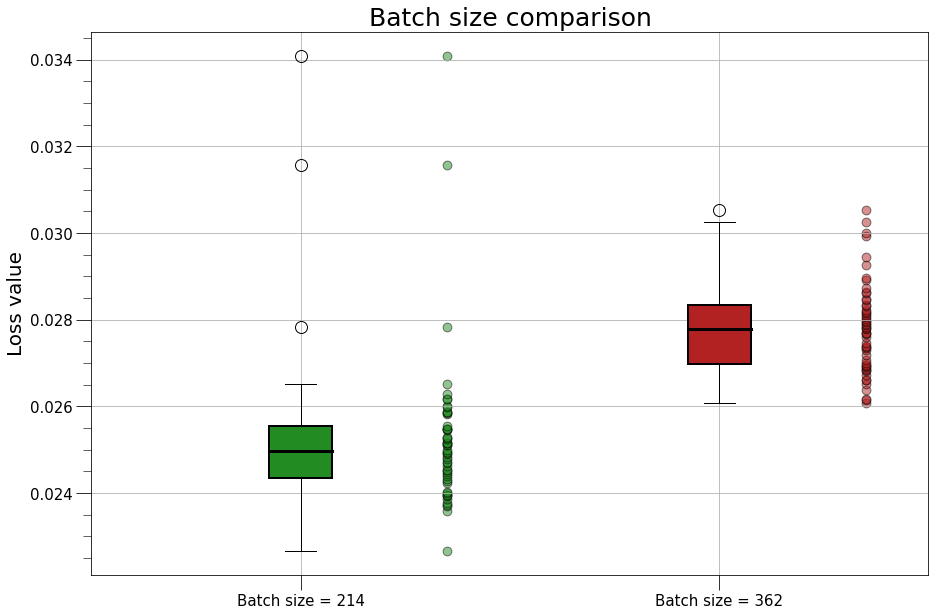

In [286]:
from Amos_package import boxplot

batc_arr = [df_results[df_results['Batch'] == 214]['Validation_epoch_6'],\
        df_results[df_results['Batch'] == 362]['Validation_epoch_6']]
labels = ['Batch size = 214', 'Batch size = 214']        
fig, ax = boxplot.boxplot(y= batc_arr, colors = ['forestgreen', 'firebrick'], labels = labels,\
        xlabel = '', ylabel = 'Loss value', y_font = 20, title = 'Batch size comparison',\
                font_title = 25)
ax.set_xticks([1, 2])
ax.set_xticklabels(['Batch size = 214', 'Batch size = 362'])


ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.grid()

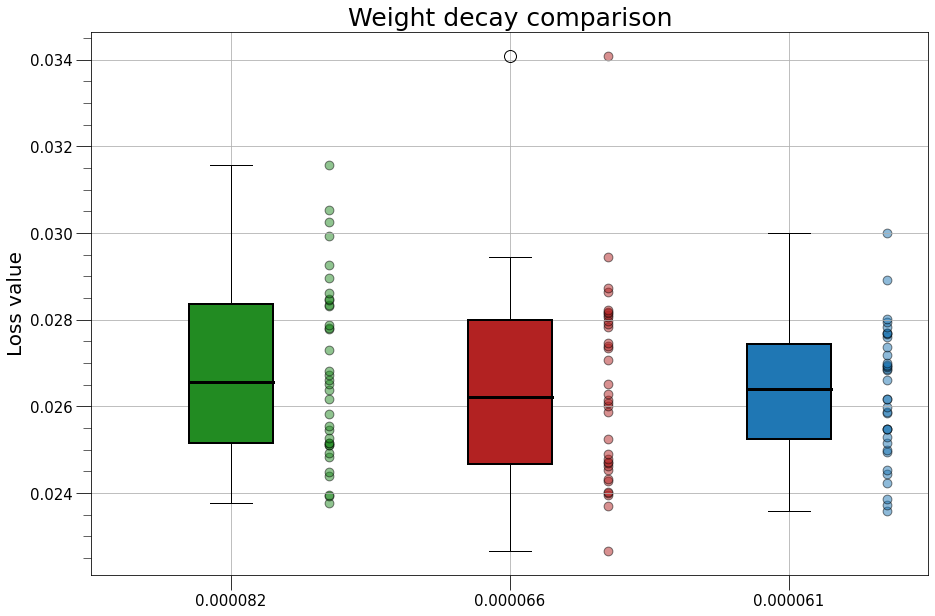

In [303]:
learning_arr = [df_results[df_results['weight_decay'] == df_results['weight_decay'].unique()[2]]['Validation_epoch_6'],\
df_results[df_results['weight_decay'] == df_results['weight_decay'].unique()[0]]['Validation_epoch_6'],\
df_results[df_results['weight_decay'] == df_results['weight_decay'].unique()[1]]['Validation_epoch_6']]

labels = [df_results['weight_decay'].unique()[2],\
    df_results['weight_decay'].unique()[0],\
        df_results['weight_decay'].unique()[1]]   

fig, ax = boxplot.boxplot(y= learning_arr, colors = ['forestgreen', 'firebrick', 'C0'], labels = labels,\
        xlabel = '', ylabel = 'Loss value', y_font = 20, title = 'Weight decay comparison',\
                font_title = 25)

ax.set_xticklabels([f'{labels[0]:.6f}',\
     f'{labels[1]:.6f}',\
    f'{labels[2]:.6f}'])


ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.grid()

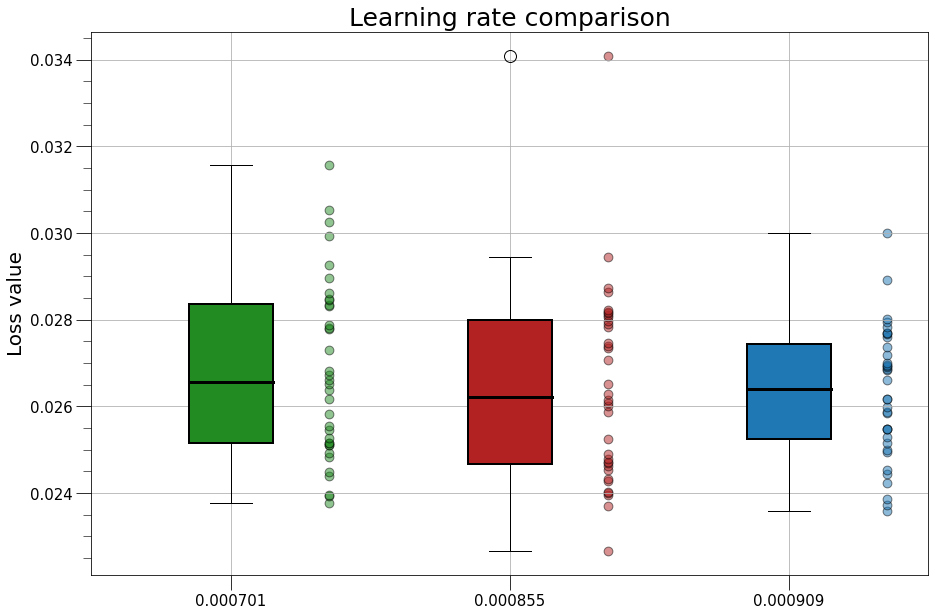

In [304]:
weigh_dec = [df_results[df_results['learning rate'] == df_results['learning rate'].unique()[2]]['Validation_epoch_6'],\
df_results[df_results['learning rate'] == df_results['learning rate'].unique()[0]]['Validation_epoch_6'],\
df_results[df_results['learning rate'] == df_results['learning rate'].unique()[1]]['Validation_epoch_6']]

labels = [df_results['learning rate'].unique()[2],\
    df_results['learning rate'].unique()[0],\
        df_results['learning rate'].unique()[1]]   

fig, ax = boxplot.boxplot(y= learning_arr, colors = ['forestgreen', 'firebrick', 'C0'], labels = labels,\
        xlabel = '', ylabel = 'Loss value', y_font = 20, title = 'Learning rate comparison',\
                font_title = 25)

ax.set_xticklabels([f'{labels[0]:.6f}',\
     f'{labels[1]:.6f}',\
    f'{labels[2]:.6f}'])


ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.grid()

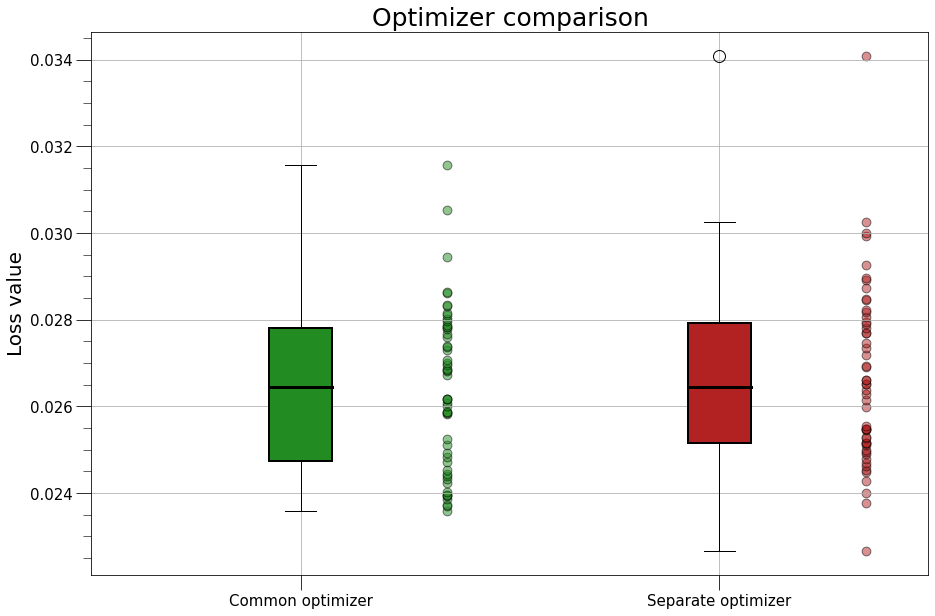

In [306]:
batc_arr = [df_results[df_results['Optimizer'] == 'Common']['Validation_epoch_6'],\
        df_results[df_results['Optimizer'] == 'Separate']['Validation_epoch_6']]
labels = ['Batch size = 214', 'Batch size = 214']        
fig, ax = boxplot.boxplot(y= batc_arr, colors = ['forestgreen', 'firebrick'], labels = labels,\
        xlabel = '', ylabel = 'Loss value', y_font = 20, title = 'Optimizer comparison',\
                font_title = 25)
ax.set_xticks([1, 2])
ax.set_xticklabels(['Common optimizer', 'Separate optimizer'])


ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.grid()

### Encoded dimension representation

We also show the validation loss progression for all the models differentiating it by the number of encoded dimension. As noted earlyier we don't see a clear cut winner, suggesting that the dimension tested are too close together to make them independent of all the other parameters.

We do have to notice though that the very first model tested reached a validation model of $\approx$ $0.3$ while the best performing random search model, in only 6 training epochs, reached a validation loss of $\approx$ $0.2$ and that's should mainly be due to the latent space dimension.

/var/folders/92/pt64shtn3fx70tf0m4ng91240000gn/T/ipykernel_863/2559560411.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['Validation epoch 1', 'Validation epoch 2', 'Validation epoch 3',\


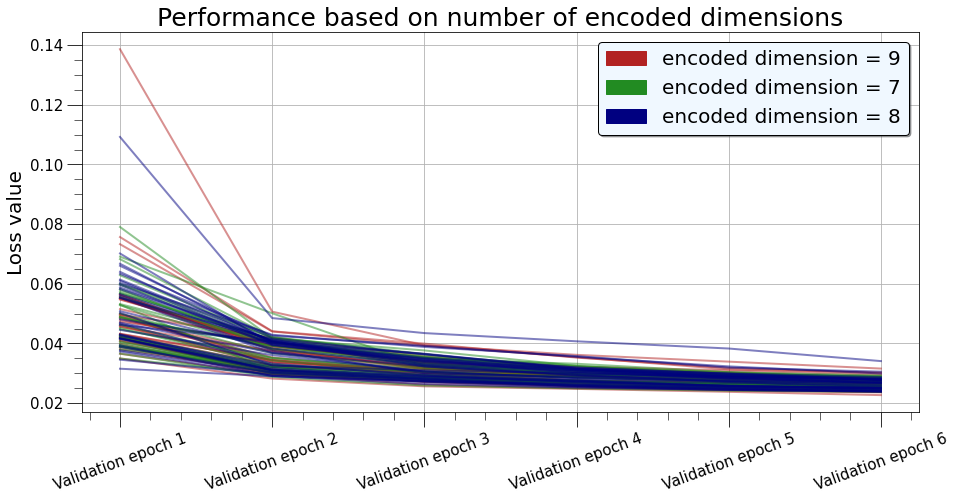

In [12]:
enc_9 = df_results[df_results['enc_dim'] == 9]
enc_8 = df_results[df_results['enc_dim'] == 8]
enc_7 = df_results[df_results['enc_dim'] == 7]


navy_patch = mpatches.Patch(color='navy')
forestgreen_patch = mpatches.Patch(color='forestgreen')
firebrick_patch = mpatches.Patch(color='firebrick')

fig, ax = plt.subplots(1, 1, figsize = (15, 7))
ax.plot(enc_9[['Validation_epoch_1', 'Validation_epoch_2', 'Validation_epoch_3', 'Validation_epoch_4',\
    'Validation_epoch_5', 'Validation_epoch_6']].T, color='firebrick', linewidth = 2, zorder = 2,\
        alpha=0.5)

ax.plot(enc_7[['Validation_epoch_1', 'Validation_epoch_2', 'Validation_epoch_3', 'Validation_epoch_4',\
    'Validation_epoch_5', 'Validation_epoch_6']].T, color='forestgreen', linewidth = 2, zorder = 2,\
        alpha=0.5)

ax.plot(enc_8[['Validation_epoch_1', 'Validation_epoch_2', 'Validation_epoch_3', 'Validation_epoch_4',\
    'Validation_epoch_5', 'Validation_epoch_6']].T, color='navy', linewidth = 2, zorder = 2,\
        alpha=0.5)

ax.set_title('Performance based on number of encoded dimensions', fontsize = 25)
ax.minorticks_on()
ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.set_xticklabels(['Validation epoch 1', 'Validation epoch 2', 'Validation epoch 3',\
     'Validation epoch 4', 'Validation epoch 5', 'Validation epoch 6'],\
        rotation = 20)
ax.set_ylabel('Loss value', fontsize = 20)
ax.legend(handles = [firebrick_patch, forestgreen_patch, navy_patch],\
        labels=['encoded dimension = 9', 'encoded dimension = 7', 'encoded dimension = 8'], \
                fontsize = 20, edgecolor= 'black', facecolor='aliceblue', shadow = True, \
                        loc = 'upper right')

ax.grid(zorder = 1)
plt.show()

In [349]:
best_params = df_results.head(1)
best_params

,Batch,Optimizer,weight_decay,enc_dim,learning rate,Training_epoch_1,Training_epoch_2,Training_epoch_3,Training_epoch_4,Training_epoch_5,Training_epoch_6,Validation_epoch_1,Validation_epoch_2,Validation_epoch_3,Validation_epoch_4,Validation_epoch_5,Validation_epoch_6
0,214,Separate,0.000066,9,0.000855,0.085484,0.038377,0.033113,0.030494,0.029398,0.028433,0.034959,0.028217,0.025609,0.024756,0.023774,0.022673


## Final model training

In the section below we define the model with the best parameters as found in the random search, we then train it in 20 epochs and see the final results.

In [21]:
batch_size = 214
enc_dim = 9
optimizer = 'Separate'
learning_rate = learning_rates[1]
weight_decay = weight_decays[1]

train_dataloader = DataLoader(final_train, batch_size, shuffle=True)

test_dataloader = DataLoader(test_dataset, batch_size, shuffle=False)


encoder_final = Encoder(encoded_space_dim=enc_dim)
decoder_final = Decoder(encoded_space_dim=enc_dim)

Epoch 1/20
	 partial train loss (single batch): 0.194972
	 partial train loss (single batch): 0.185713
	 partial train loss (single batch): 0.192929
	 partial train loss (single batch): 0.186899
	 partial train loss (single batch): 0.184135
	 partial train loss (single batch): 0.190960
	 partial train loss (single batch): 0.192901
	 partial train loss (single batch): 0.196116
	 partial train loss (single batch): 0.191633
	 partial train loss (single batch): 0.188014
	 partial train loss (single batch): 0.190580
	 partial train loss (single batch): 0.189643
	 partial train loss (single batch): 0.186260
	 partial train loss (single batch): 0.196681
	 partial train loss (single batch): 0.192115
	 partial train loss (single batch): 0.186080
	 partial train loss (single batch): 0.188787
	 partial train loss (single batch): 0.192597
	 partial train loss (single batch): 0.187387
	 partial train loss (single batch): 0.186929
	 partial train loss (single batch): 0.188654
	 partial train loss (s

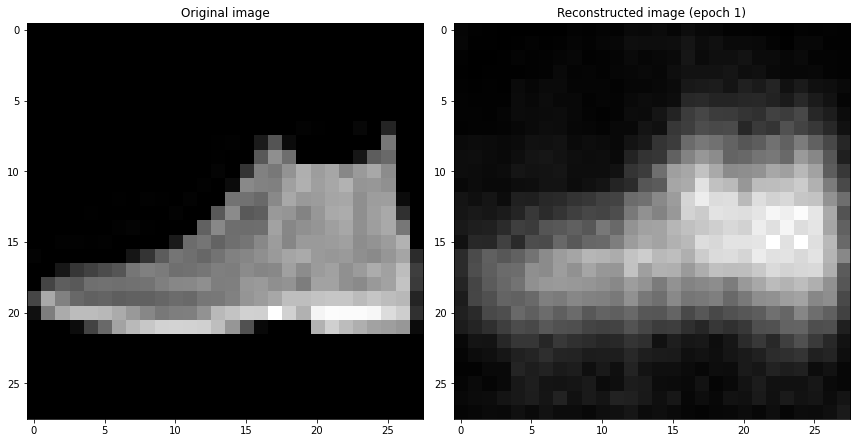

Epoch 2/20
	 partial train loss (single batch): 0.051324
	 partial train loss (single batch): 0.055689
	 partial train loss (single batch): 0.052806
	 partial train loss (single batch): 0.055629
	 partial train loss (single batch): 0.053695
	 partial train loss (single batch): 0.056230
	 partial train loss (single batch): 0.051907
	 partial train loss (single batch): 0.052718
	 partial train loss (single batch): 0.057201
	 partial train loss (single batch): 0.052997
	 partial train loss (single batch): 0.053595
	 partial train loss (single batch): 0.057344
	 partial train loss (single batch): 0.051905
	 partial train loss (single batch): 0.051477
	 partial train loss (single batch): 0.055472
	 partial train loss (single batch): 0.051867
	 partial train loss (single batch): 0.049954
	 partial train loss (single batch): 0.048264
	 partial train loss (single batch): 0.052098
	 partial train loss (single batch): 0.051487
	 partial train loss (single batch): 0.055548
	 partial train loss (s

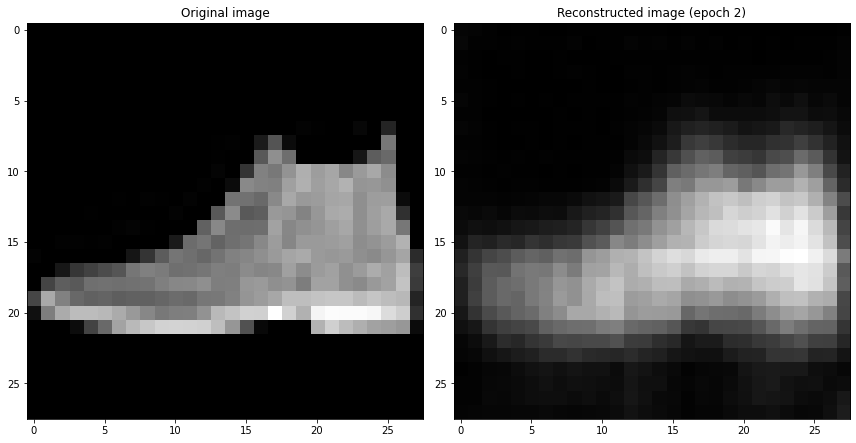

Epoch 3/20
	 partial train loss (single batch): 0.035694
	 partial train loss (single batch): 0.077918
	 partial train loss (single batch): 0.039873
	 partial train loss (single batch): 0.052868
	 partial train loss (single batch): 0.059152
	 partial train loss (single batch): 0.044741
	 partial train loss (single batch): 0.037534
	 partial train loss (single batch): 0.045414
	 partial train loss (single batch): 0.047835
	 partial train loss (single batch): 0.047400
	 partial train loss (single batch): 0.043070
	 partial train loss (single batch): 0.039440
	 partial train loss (single batch): 0.042719
	 partial train loss (single batch): 0.043490
	 partial train loss (single batch): 0.045734
	 partial train loss (single batch): 0.043684
	 partial train loss (single batch): 0.038345
	 partial train loss (single batch): 0.039208
	 partial train loss (single batch): 0.042557
	 partial train loss (single batch): 0.040039
	 partial train loss (single batch): 0.044521
	 partial train loss (s

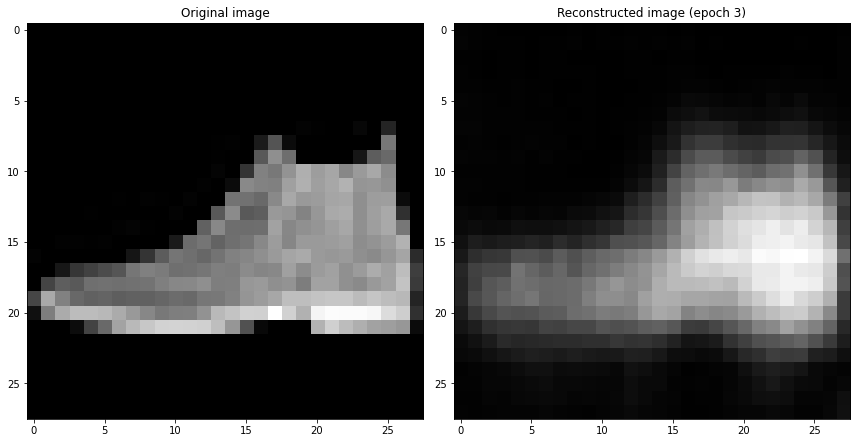

Epoch 4/20
	 partial train loss (single batch): 0.032632
	 partial train loss (single batch): 0.078151
	 partial train loss (single batch): 0.038619
	 partial train loss (single batch): 0.056736
	 partial train loss (single batch): 0.048796
	 partial train loss (single batch): 0.038162
	 partial train loss (single batch): 0.035789
	 partial train loss (single batch): 0.042029
	 partial train loss (single batch): 0.044589
	 partial train loss (single batch): 0.041458
	 partial train loss (single batch): 0.036740
	 partial train loss (single batch): 0.035231
	 partial train loss (single batch): 0.039136
	 partial train loss (single batch): 0.037897
	 partial train loss (single batch): 0.038365
	 partial train loss (single batch): 0.033910
	 partial train loss (single batch): 0.034981
	 partial train loss (single batch): 0.035359
	 partial train loss (single batch): 0.037577
	 partial train loss (single batch): 0.036491
	 partial train loss (single batch): 0.036781
	 partial train loss (s

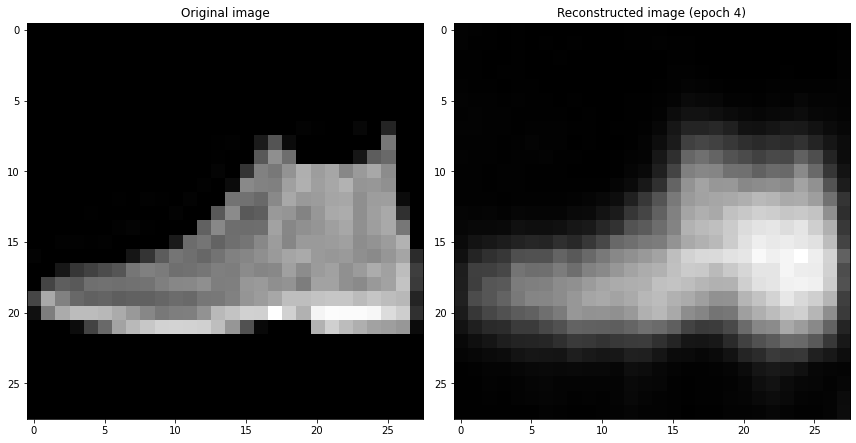

Epoch 5/20
	 partial train loss (single batch): 0.030490
	 partial train loss (single batch): 0.075402
	 partial train loss (single batch): 0.039582
	 partial train loss (single batch): 0.053699
	 partial train loss (single batch): 0.045606
	 partial train loss (single batch): 0.037070
	 partial train loss (single batch): 0.038934
	 partial train loss (single batch): 0.043588
	 partial train loss (single batch): 0.043206
	 partial train loss (single batch): 0.038885
	 partial train loss (single batch): 0.033898
	 partial train loss (single batch): 0.034493
	 partial train loss (single batch): 0.037651
	 partial train loss (single batch): 0.036040
	 partial train loss (single batch): 0.036472
	 partial train loss (single batch): 0.033706
	 partial train loss (single batch): 0.035247
	 partial train loss (single batch): 0.033997
	 partial train loss (single batch): 0.036216
	 partial train loss (single batch): 0.035032
	 partial train loss (single batch): 0.033104
	 partial train loss (s

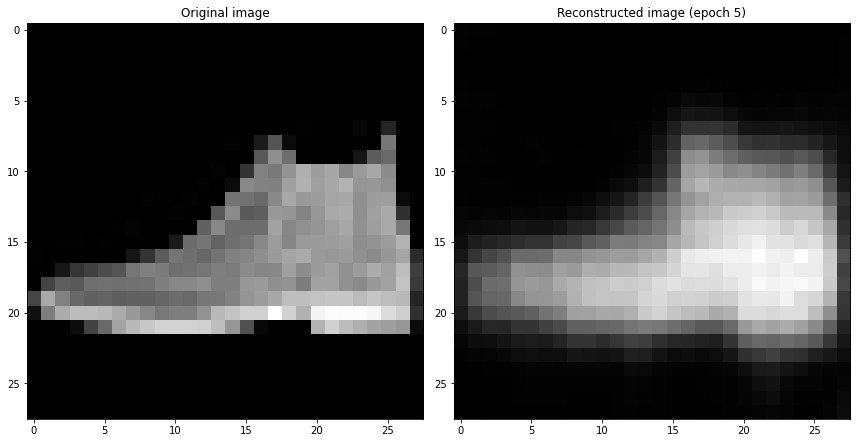

Epoch 6/20
	 partial train loss (single batch): 0.029718
	 partial train loss (single batch): 0.081155
	 partial train loss (single batch): 0.036787
	 partial train loss (single batch): 0.054472
	 partial train loss (single batch): 0.052342
	 partial train loss (single batch): 0.036501
	 partial train loss (single batch): 0.039644
	 partial train loss (single batch): 0.043469
	 partial train loss (single batch): 0.041753
	 partial train loss (single batch): 0.041118
	 partial train loss (single batch): 0.030454
	 partial train loss (single batch): 0.032881
	 partial train loss (single batch): 0.035682
	 partial train loss (single batch): 0.038497
	 partial train loss (single batch): 0.036080
	 partial train loss (single batch): 0.033370
	 partial train loss (single batch): 0.033887
	 partial train loss (single batch): 0.034268
	 partial train loss (single batch): 0.033834
	 partial train loss (single batch): 0.035601
	 partial train loss (single batch): 0.032365
	 partial train loss (s

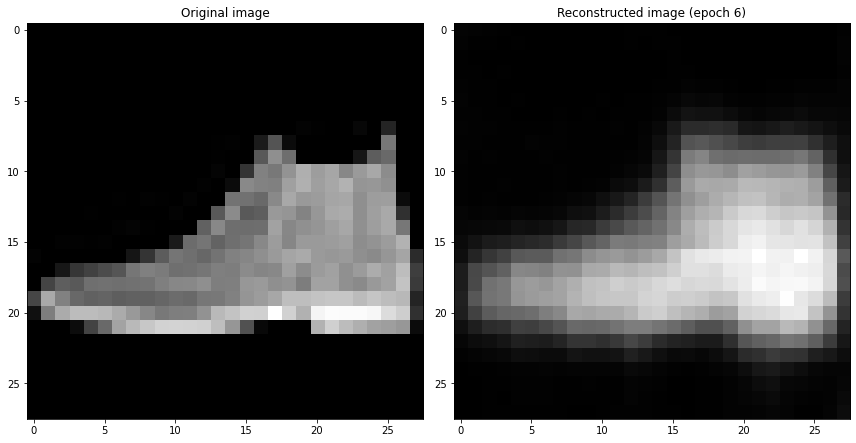

Epoch 7/20
	 partial train loss (single batch): 0.030468
	 partial train loss (single batch): 0.062408
	 partial train loss (single batch): 0.041792
	 partial train loss (single batch): 0.051453
	 partial train loss (single batch): 0.035085
	 partial train loss (single batch): 0.033591
	 partial train loss (single batch): 0.040335
	 partial train loss (single batch): 0.039122
	 partial train loss (single batch): 0.032582
	 partial train loss (single batch): 0.032272
	 partial train loss (single batch): 0.037027
	 partial train loss (single batch): 0.033779
	 partial train loss (single batch): 0.031013
	 partial train loss (single batch): 0.034747
	 partial train loss (single batch): 0.034418
	 partial train loss (single batch): 0.033848
	 partial train loss (single batch): 0.029186
	 partial train loss (single batch): 0.031249
	 partial train loss (single batch): 0.031814
	 partial train loss (single batch): 0.034339
	 partial train loss (single batch): 0.032043
	 partial train loss (s

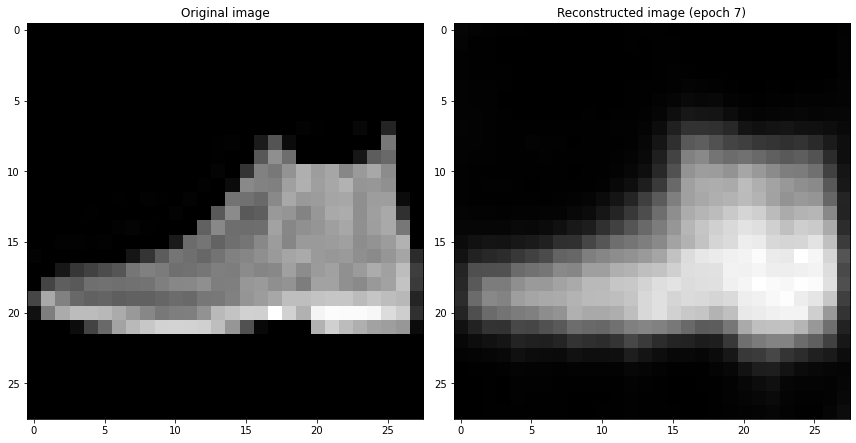

Epoch 8/20
	 partial train loss (single batch): 0.029955
	 partial train loss (single batch): 0.061130
	 partial train loss (single batch): 0.038050
	 partial train loss (single batch): 0.045598
	 partial train loss (single batch): 0.033303
	 partial train loss (single batch): 0.037792
	 partial train loss (single batch): 0.039026
	 partial train loss (single batch): 0.036946
	 partial train loss (single batch): 0.034387
	 partial train loss (single batch): 0.034008
	 partial train loss (single batch): 0.034690
	 partial train loss (single batch): 0.032964
	 partial train loss (single batch): 0.029568
	 partial train loss (single batch): 0.032529
	 partial train loss (single batch): 0.033809
	 partial train loss (single batch): 0.033140
	 partial train loss (single batch): 0.030549
	 partial train loss (single batch): 0.029983
	 partial train loss (single batch): 0.030417
	 partial train loss (single batch): 0.030420
	 partial train loss (single batch): 0.029940
	 partial train loss (s

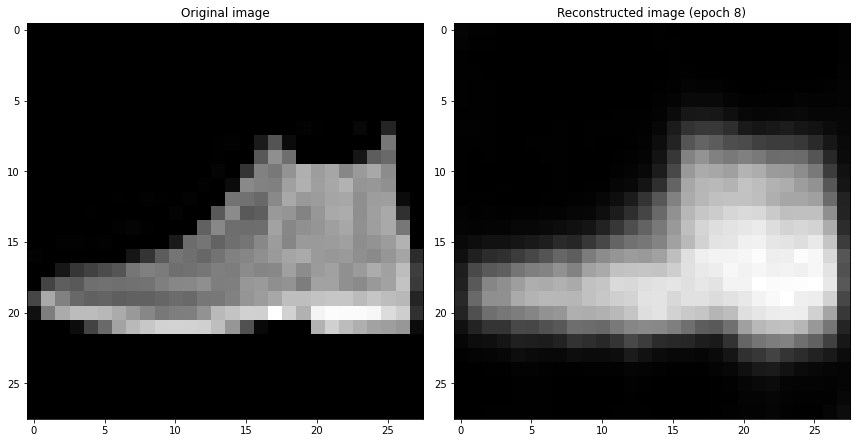

Epoch 9/20
	 partial train loss (single batch): 0.027473
	 partial train loss (single batch): 0.071349
	 partial train loss (single batch): 0.037142
	 partial train loss (single batch): 0.058243
	 partial train loss (single batch): 0.051489
	 partial train loss (single batch): 0.037063
	 partial train loss (single batch): 0.037828
	 partial train loss (single batch): 0.046029
	 partial train loss (single batch): 0.038713
	 partial train loss (single batch): 0.032870
	 partial train loss (single batch): 0.031590
	 partial train loss (single batch): 0.032021
	 partial train loss (single batch): 0.036931
	 partial train loss (single batch): 0.037180
	 partial train loss (single batch): 0.035730
	 partial train loss (single batch): 0.032180
	 partial train loss (single batch): 0.030448
	 partial train loss (single batch): 0.030836
	 partial train loss (single batch): 0.032051
	 partial train loss (single batch): 0.030617
	 partial train loss (single batch): 0.030825
	 partial train loss (s

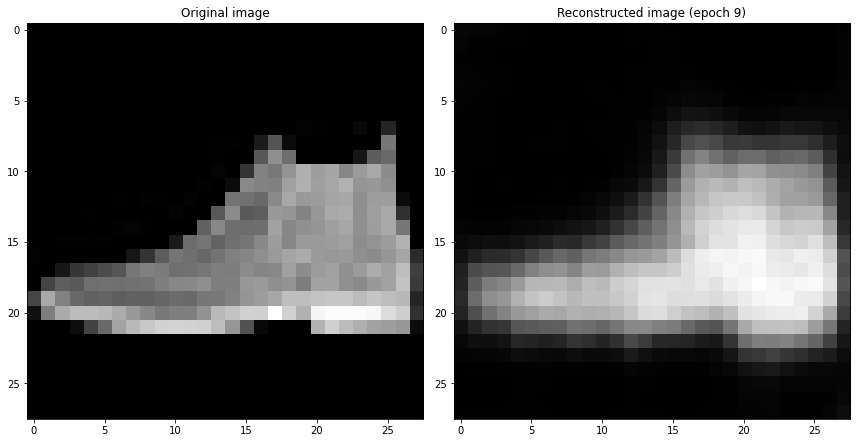

Epoch 10/20
	 partial train loss (single batch): 0.027377
	 partial train loss (single batch): 0.111077
	 partial train loss (single batch): 0.034376
	 partial train loss (single batch): 0.054041
	 partial train loss (single batch): 0.068120
	 partial train loss (single batch): 0.062117
	 partial train loss (single batch): 0.044911
	 partial train loss (single batch): 0.036686
	 partial train loss (single batch): 0.037724
	 partial train loss (single batch): 0.045243
	 partial train loss (single batch): 0.046432
	 partial train loss (single batch): 0.041112
	 partial train loss (single batch): 0.033761
	 partial train loss (single batch): 0.032401
	 partial train loss (single batch): 0.036029
	 partial train loss (single batch): 0.038935
	 partial train loss (single batch): 0.036063
	 partial train loss (single batch): 0.038276
	 partial train loss (single batch): 0.034261
	 partial train loss (single batch): 0.031172
	 partial train loss (single batch): 0.030584
	 partial train loss (

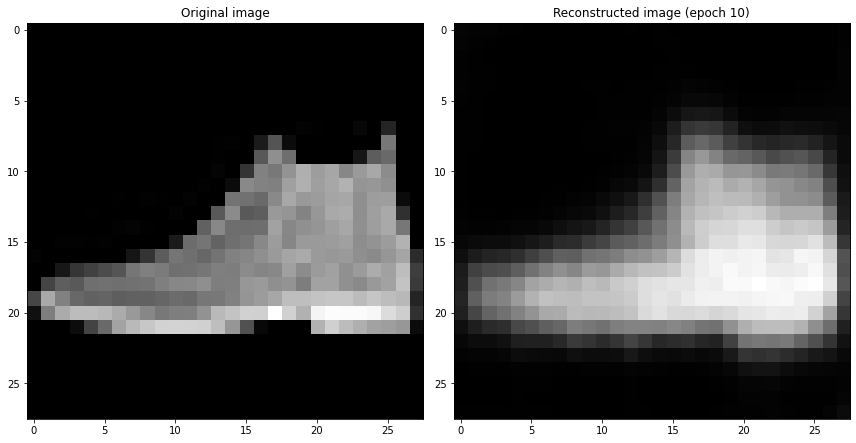

Epoch 11/20
	 partial train loss (single batch): 0.025106
	 partial train loss (single batch): 0.114663
	 partial train loss (single batch): 0.031984
	 partial train loss (single batch): 0.048477
	 partial train loss (single batch): 0.063462
	 partial train loss (single batch): 0.060331
	 partial train loss (single batch): 0.049487
	 partial train loss (single batch): 0.039462
	 partial train loss (single batch): 0.039789
	 partial train loss (single batch): 0.042585
	 partial train loss (single batch): 0.040811
	 partial train loss (single batch): 0.038662
	 partial train loss (single batch): 0.034845
	 partial train loss (single batch): 0.030791
	 partial train loss (single batch): 0.033350
	 partial train loss (single batch): 0.036435
	 partial train loss (single batch): 0.036425
	 partial train loss (single batch): 0.034595
	 partial train loss (single batch): 0.034064
	 partial train loss (single batch): 0.031805
	 partial train loss (single batch): 0.031892
	 partial train loss (

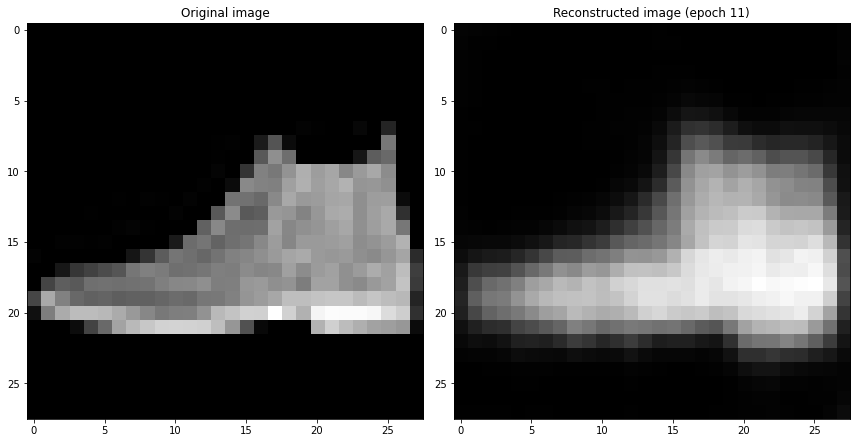

Epoch 12/20
	 partial train loss (single batch): 0.026625
	 partial train loss (single batch): 0.051989
	 partial train loss (single batch): 0.041170
	 partial train loss (single batch): 0.035102
	 partial train loss (single batch): 0.035304
	 partial train loss (single batch): 0.039123
	 partial train loss (single batch): 0.033204
	 partial train loss (single batch): 0.029166
	 partial train loss (single batch): 0.028518
	 partial train loss (single batch): 0.031305
	 partial train loss (single batch): 0.031216
	 partial train loss (single batch): 0.030864
	 partial train loss (single batch): 0.029609
	 partial train loss (single batch): 0.030436
	 partial train loss (single batch): 0.028695
	 partial train loss (single batch): 0.027315
	 partial train loss (single batch): 0.030077
	 partial train loss (single batch): 0.028153
	 partial train loss (single batch): 0.028262
	 partial train loss (single batch): 0.026041
	 partial train loss (single batch): 0.028326
	 partial train loss (

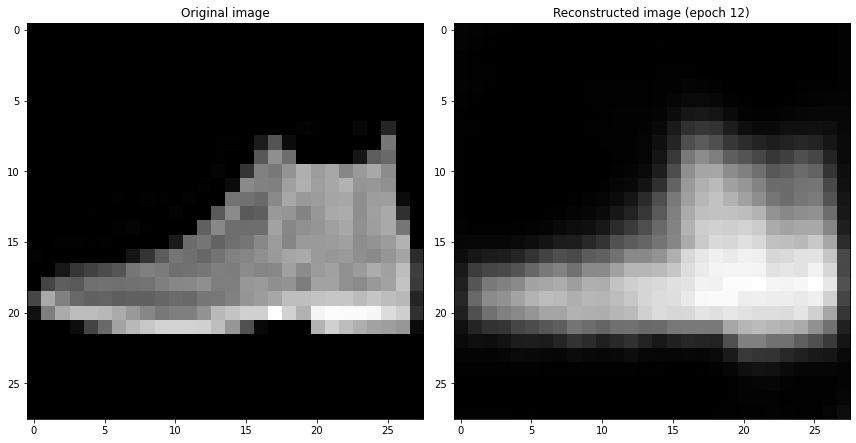

Epoch 13/20
	 partial train loss (single batch): 0.026651
	 partial train loss (single batch): 0.073380
	 partial train loss (single batch): 0.031316
	 partial train loss (single batch): 0.057905
	 partial train loss (single batch): 0.043789
	 partial train loss (single batch): 0.032222
	 partial train loss (single batch): 0.036602
	 partial train loss (single batch): 0.043291
	 partial train loss (single batch): 0.042311
	 partial train loss (single batch): 0.034441
	 partial train loss (single batch): 0.030208
	 partial train loss (single batch): 0.031385
	 partial train loss (single batch): 0.035824
	 partial train loss (single batch): 0.037250
	 partial train loss (single batch): 0.030862
	 partial train loss (single batch): 0.029263
	 partial train loss (single batch): 0.028843
	 partial train loss (single batch): 0.030626
	 partial train loss (single batch): 0.030531
	 partial train loss (single batch): 0.030924
	 partial train loss (single batch): 0.030132
	 partial train loss (

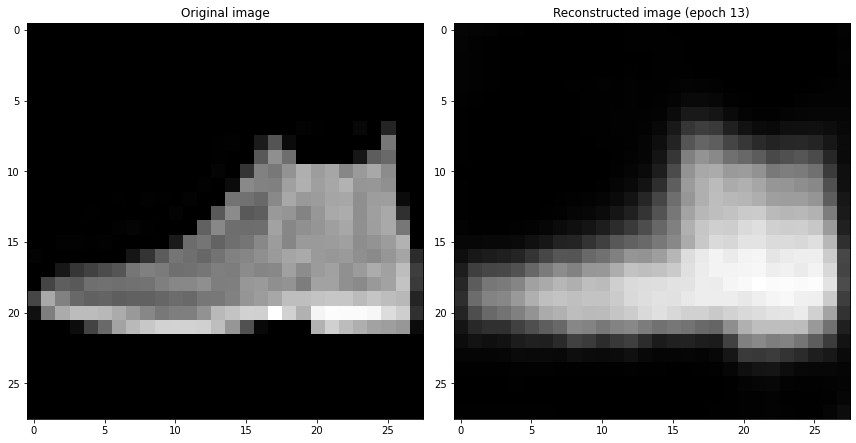

Epoch 14/20
	 partial train loss (single batch): 0.026317
	 partial train loss (single batch): 0.101699
	 partial train loss (single batch): 0.031857
	 partial train loss (single batch): 0.053119
	 partial train loss (single batch): 0.060817
	 partial train loss (single batch): 0.055469
	 partial train loss (single batch): 0.038650
	 partial train loss (single batch): 0.032479
	 partial train loss (single batch): 0.035758
	 partial train loss (single batch): 0.041391
	 partial train loss (single batch): 0.043438
	 partial train loss (single batch): 0.038377
	 partial train loss (single batch): 0.031349
	 partial train loss (single batch): 0.029325
	 partial train loss (single batch): 0.029842
	 partial train loss (single batch): 0.034668
	 partial train loss (single batch): 0.035855
	 partial train loss (single batch): 0.035570
	 partial train loss (single batch): 0.034035
	 partial train loss (single batch): 0.032418
	 partial train loss (single batch): 0.029513
	 partial train loss (

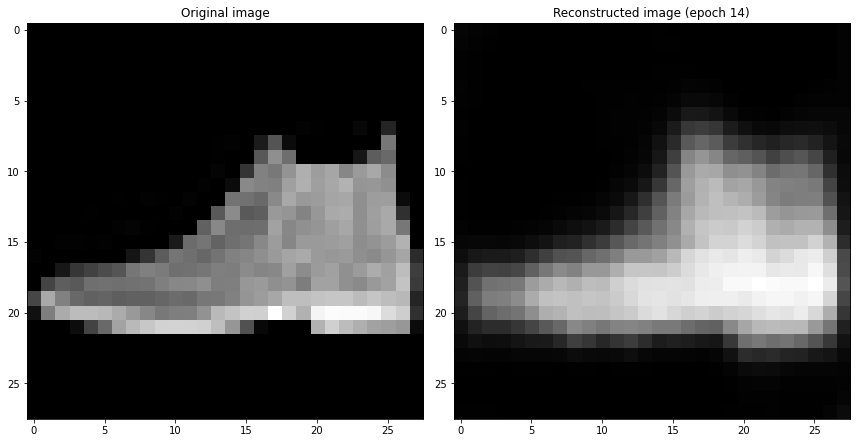

Epoch 15/20
	 partial train loss (single batch): 0.026410
	 partial train loss (single batch): 0.089333
	 partial train loss (single batch): 0.030222
	 partial train loss (single batch): 0.049994
	 partial train loss (single batch): 0.059799
	 partial train loss (single batch): 0.049001
	 partial train loss (single batch): 0.036324
	 partial train loss (single batch): 0.031601
	 partial train loss (single batch): 0.039778
	 partial train loss (single batch): 0.040601
	 partial train loss (single batch): 0.038827
	 partial train loss (single batch): 0.034725
	 partial train loss (single batch): 0.030439
	 partial train loss (single batch): 0.031497
	 partial train loss (single batch): 0.034015
	 partial train loss (single batch): 0.034165
	 partial train loss (single batch): 0.033456
	 partial train loss (single batch): 0.032570
	 partial train loss (single batch): 0.029566
	 partial train loss (single batch): 0.027580
	 partial train loss (single batch): 0.029085
	 partial train loss (

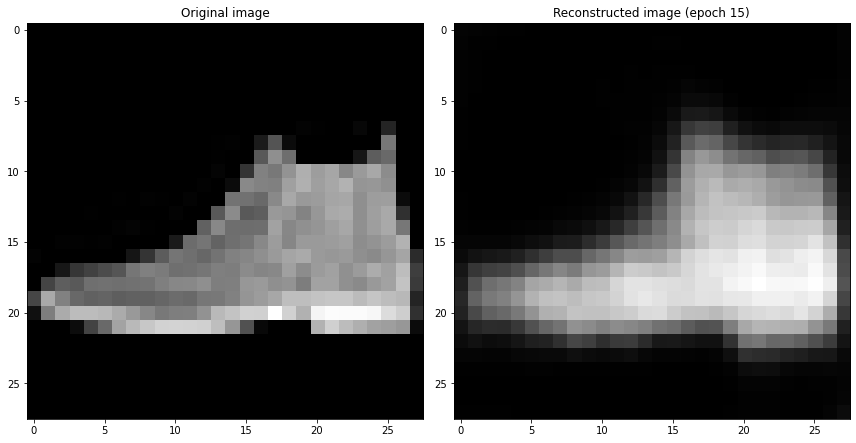

Epoch 16/20
	 partial train loss (single batch): 0.024160
	 partial train loss (single batch): 0.069506
	 partial train loss (single batch): 0.034697
	 partial train loss (single batch): 0.046554
	 partial train loss (single batch): 0.045189
	 partial train loss (single batch): 0.036690
	 partial train loss (single batch): 0.035512
	 partial train loss (single batch): 0.039028
	 partial train loss (single batch): 0.038991
	 partial train loss (single batch): 0.034810
	 partial train loss (single batch): 0.027980
	 partial train loss (single batch): 0.030550
	 partial train loss (single batch): 0.032210
	 partial train loss (single batch): 0.037144
	 partial train loss (single batch): 0.032505
	 partial train loss (single batch): 0.030083
	 partial train loss (single batch): 0.029113
	 partial train loss (single batch): 0.029093
	 partial train loss (single batch): 0.030722
	 partial train loss (single batch): 0.029586
	 partial train loss (single batch): 0.028114
	 partial train loss (

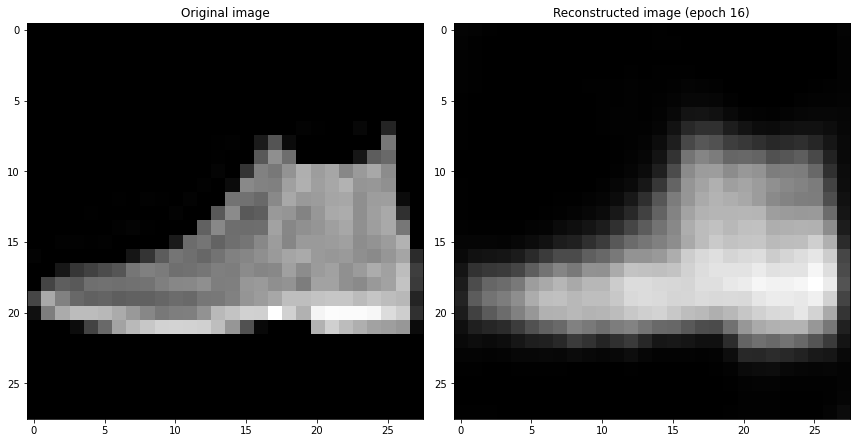

Epoch 17/20
	 partial train loss (single batch): 0.024700
	 partial train loss (single batch): 0.077673
	 partial train loss (single batch): 0.029978
	 partial train loss (single batch): 0.057448
	 partial train loss (single batch): 0.040470
	 partial train loss (single batch): 0.028388
	 partial train loss (single batch): 0.031653
	 partial train loss (single batch): 0.037714
	 partial train loss (single batch): 0.038345
	 partial train loss (single batch): 0.033182
	 partial train loss (single batch): 0.027130
	 partial train loss (single batch): 0.029262
	 partial train loss (single batch): 0.031306
	 partial train loss (single batch): 0.033348
	 partial train loss (single batch): 0.029952
	 partial train loss (single batch): 0.028170
	 partial train loss (single batch): 0.028851
	 partial train loss (single batch): 0.030146
	 partial train loss (single batch): 0.027745
	 partial train loss (single batch): 0.027844
	 partial train loss (single batch): 0.026703
	 partial train loss (

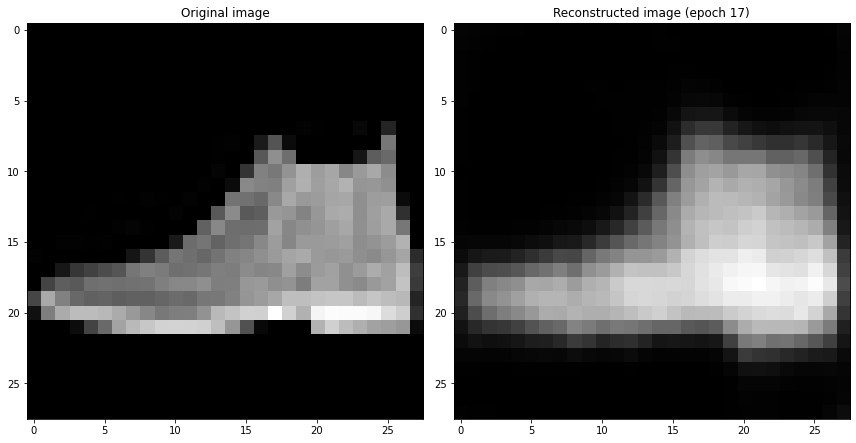

Epoch 18/20
	 partial train loss (single batch): 0.024886
	 partial train loss (single batch): 0.055461
	 partial train loss (single batch): 0.037566
	 partial train loss (single batch): 0.041336
	 partial train loss (single batch): 0.031299
	 partial train loss (single batch): 0.033925
	 partial train loss (single batch): 0.038044
	 partial train loss (single batch): 0.033686
	 partial train loss (single batch): 0.026326
	 partial train loss (single batch): 0.028106
	 partial train loss (single batch): 0.032512
	 partial train loss (single batch): 0.032074
	 partial train loss (single batch): 0.030997
	 partial train loss (single batch): 0.027556
	 partial train loss (single batch): 0.029804
	 partial train loss (single batch): 0.031352
	 partial train loss (single batch): 0.029178
	 partial train loss (single batch): 0.026712
	 partial train loss (single batch): 0.028948
	 partial train loss (single batch): 0.029992
	 partial train loss (single batch): 0.028640
	 partial train loss (

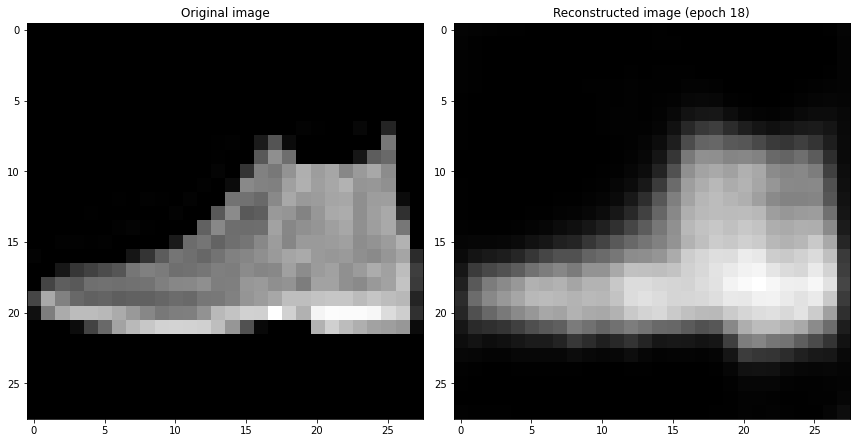

Epoch 19/20
	 partial train loss (single batch): 0.024869
	 partial train loss (single batch): 0.038465
	 partial train loss (single batch): 0.037015
	 partial train loss (single batch): 0.028919
	 partial train loss (single batch): 0.033326
	 partial train loss (single batch): 0.032213
	 partial train loss (single batch): 0.027412
	 partial train loss (single batch): 0.031597
	 partial train loss (single batch): 0.027857
	 partial train loss (single batch): 0.026728
	 partial train loss (single batch): 0.030153
	 partial train loss (single batch): 0.028359
	 partial train loss (single batch): 0.027307
	 partial train loss (single batch): 0.028073
	 partial train loss (single batch): 0.026486
	 partial train loss (single batch): 0.025249
	 partial train loss (single batch): 0.027068
	 partial train loss (single batch): 0.026790
	 partial train loss (single batch): 0.025865
	 partial train loss (single batch): 0.025584
	 partial train loss (single batch): 0.026901
	 partial train loss (

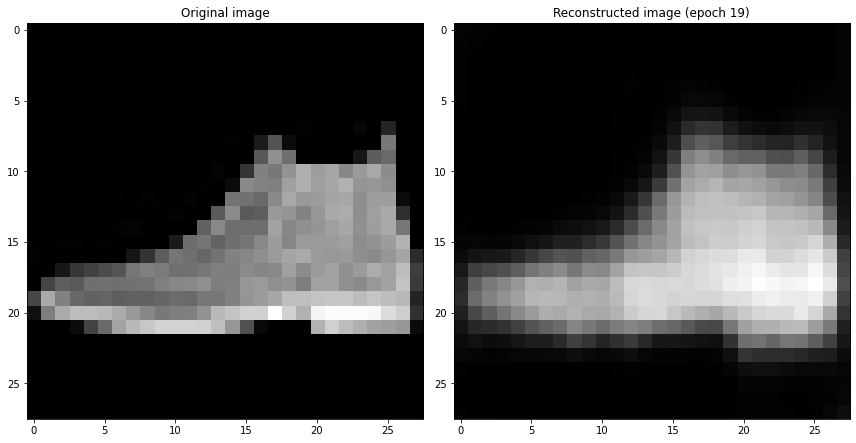

Epoch 20/20
	 partial train loss (single batch): 0.025116
	 partial train loss (single batch): 0.053319
	 partial train loss (single batch): 0.040233
	 partial train loss (single batch): 0.036464
	 partial train loss (single batch): 0.030138
	 partial train loss (single batch): 0.033320
	 partial train loss (single batch): 0.034507
	 partial train loss (single batch): 0.030542
	 partial train loss (single batch): 0.028838
	 partial train loss (single batch): 0.029135
	 partial train loss (single batch): 0.030397
	 partial train loss (single batch): 0.029309
	 partial train loss (single batch): 0.028316
	 partial train loss (single batch): 0.029948
	 partial train loss (single batch): 0.027325
	 partial train loss (single batch): 0.028576
	 partial train loss (single batch): 0.027327
	 partial train loss (single batch): 0.027416
	 partial train loss (single batch): 0.026754
	 partial train loss (single batch): 0.026548
	 partial train loss (single batch): 0.025231
	 partial train loss (

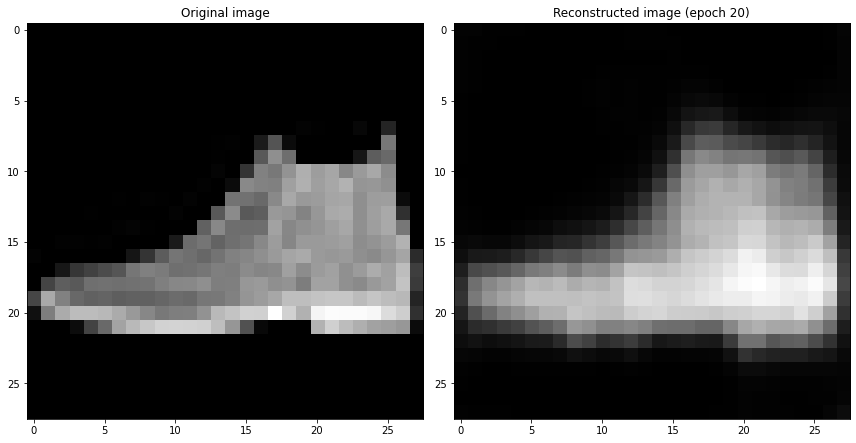

In [353]:
train_losses = []
val_losses = []

num_epochs = 20



for epoch in range(num_epochs):
    

    print('Epoch %d/%d' % (epoch + 1, num_epochs))
    # Training (use the training function)
    train_loss = train_epoch_valid(
        encoder=encoder_final, 
        decoder=decoder_final, 
        dataloader=train_dataloader, 
        optimizer_kind=optimizer,
        lr = learning_rate,
        weight_decay=weight_decay,
        loss_fn=loss_fn)

    print('\n\n\t Training - epoch %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, train_loss))
    # Validation  (use the testing function)
    val_loss = test_epoch_valid(
        encoder=encoder_final, 
        decoder=decoder_final,  
        dataloader=test_dataloader, 
        loss_fn=loss_fn)
    # Print Validationloss
    print('\n\n\t Validation - epoch %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

    train_losses.append(train_loss)
    val_losses.append(val_loss)


    img = test_dataset[0][0].unsqueeze(0)
    encoder_final.eval()
    decoder_final.eval()
    with torch.no_grad():
        rec_img  = decoder_final(encoder_final(img))
    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[0].set_title('Original image')
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[1].set_title('Reconstructed image (epoch %d)' % (epoch + 1))
    plt.tight_layout()
    plt.pause(0.1)
    # Save figures
    os.makedirs('autoencoder_final_progress_%d_features' % enc_dim, exist_ok=True)
    fig.savefig('autoencoder_final_progress_%d_features/epoch_%d.jpg' % (enc_dim, epoch + 1))
    plt.show()
    plt.close()





In [ ]:
torch.save(encoder_final.state_dict(), 'encoder_final_params.pth')
torch.save(decoder_final.state_dict(), 'decoder_final_params.pth')

In [26]:
# Load network parameters
encoder_final.load_state_dict(torch.load('encoder_final_params.pth'))
decoder_final.load_state_dict(torch.load('decoder_final_params.pth'))

<All keys matched successfully>

In [25]:
images_final = glob.glob('./autoencoder_final_progress_9_features/*')
img_idx = [int(item[0]) for item in list(map(lambda x: re.findall('[0-9][0-9]*', x[-9:]), images_final))]
#img_idx
sort_img_idx = np.argsort(img_idx)
images_final = np.array(images_final)[np.array(sort_img_idx)]

## Reconstruction progression

We see below the performance of the network in terms of reconstruction after each of the 20 epochs. <br>
We can notice how the network little by little improves its ability, expecially during the first epochs while as we go on the improvement flattens out.

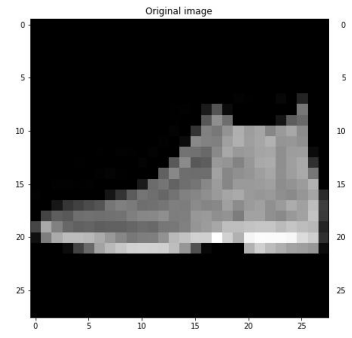

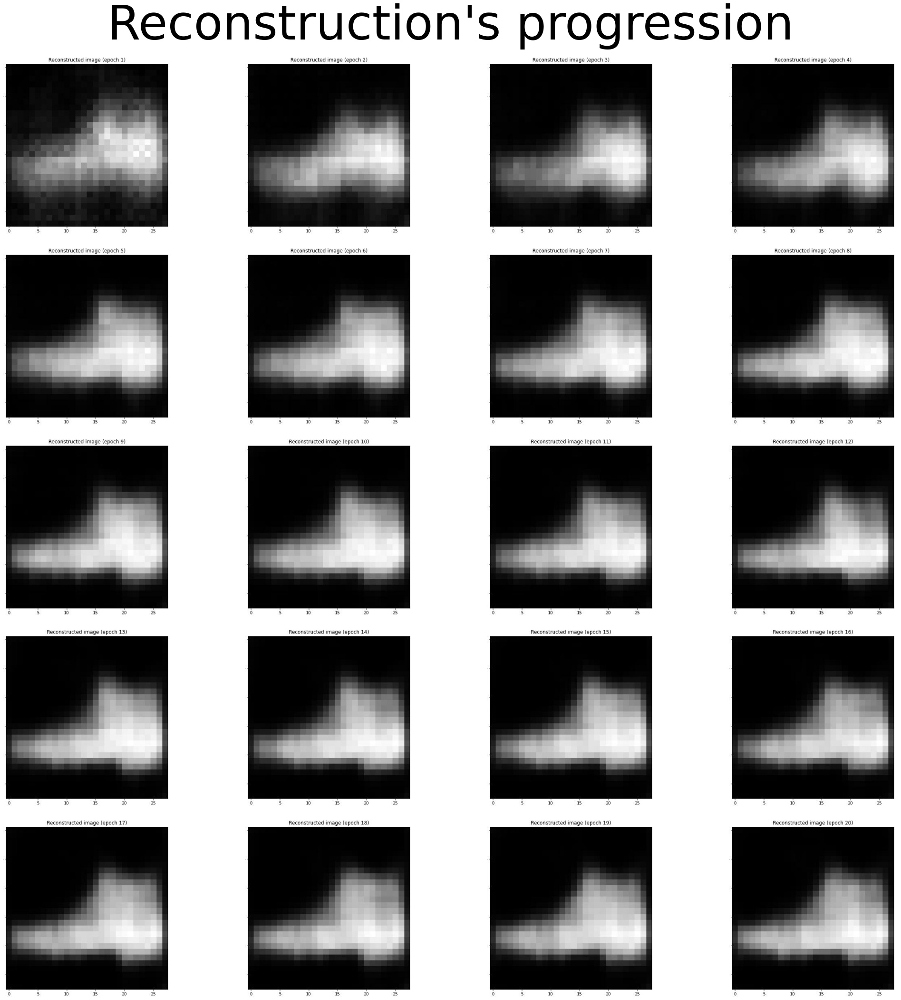

In [26]:
fig1, ax1 = plt.subplots(1, 1, figsize = (5, 5))
fig, axs = plt.subplots(5, 4, figsize = (30, 30))
ax1.imshow(mpimg.imread(images_final[0]))
ax1.set_xlim(right = 450)
ax1.axis('off')
for image, ax in zip(images_final, axs.flatten()):
    img = mpimg.imread(image)
    imgplot = ax.imshow(img)
    ax.set_xlim(left = 450)
    ax.axis('off')
fig.suptitle('Reconstruction\'s progression', fontsize = 100)

fig1.tight_layout()
fig.tight_layout(pad = 3)


In [373]:
train_json = json.dumps(list(map(lambda x:float(x.numpy()),train_losses)))

with open('train_final.json', 'w') as f:
    json.dump(train_json, f)


In [375]:
test_json = json.dumps(list(map(lambda x:float(x.numpy()), val_losses)))

with open('test_final.json', 'w') as f:
    json.dump(test_json, f)


## Training and test loss progression

In the training and test loss progression we see confirmed some tendencies that we noted already in the first notebook.<br>
For example both the two curves are fairly smooth, furthermore the test loss stays constantly below the training loss, pointing out the lack of a big overfitting effect.

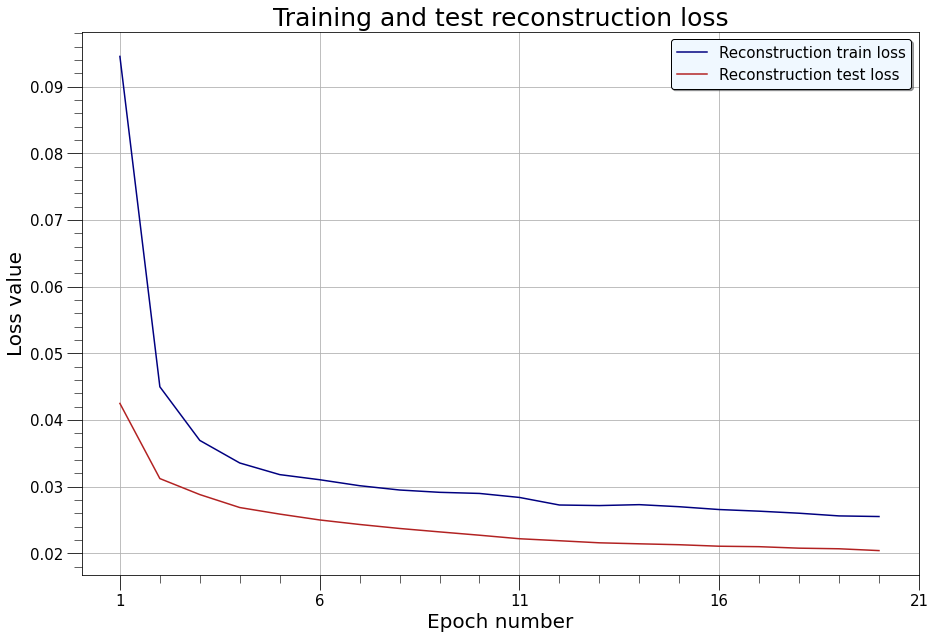

In [376]:
fig, ax = plt.subplots(1, 1, figsize = (15, 10))
ax.plot(range(len(train_losses)), list(map(lambda x:x.numpy(), train_losses)), zorder = 3, label='Reconstruction train loss',\
    color='navy')
ax.plot(range(len(val_losses)), list(map(lambda x:x.numpy(), val_losses)), zorder = 3, label='Reconstruction test loss',\
    color = 'firebrick')
ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.minorticks_on()
ax.grid(zorder = 1)
ax.legend(facecolor='aliceblue', shadow = True, edgecolor='black', fontsize = 15)
ax.set_title('Training and test reconstruction loss', fontsize = 25)
ax.set_xticks(np.arange(21)[::5])
ax.set_xticklabels(np.arange(21)[::5] + 1)
ax.set_xlabel('Epoch number', fontsize = 20)
ax.set_ylabel('Loss value', fontsize = 20)
plt.show()

## Dimensionality reduction

In this section we exploit some dimensionality reduction tecnique. <br>
In the very first model trained, the one similar to the lab's net, we had an encoded dimension of 3. The latent space though can be visually represented as scatter point in a 3 dimensional space.<br>

The final model defined above has instead a latent space that is composed by fixed-size length vectors of dimension 9. Visualization is made much more difficult by the high dimensionality of the latent space, we try to recapture this feature of the hidden units applying, one after the other, the following techniques:

- Principal Component Analysis (**PCA**): The idea of **PCA** is to reduce the dimensionality of the dataset preserving as much variability as possible. <br>
     The latter is achieved by representing the old variables with new ones that are given by a linear combination of the previouses. The new variables are orthogonal between each other, indeed, the first principal component is the one that explains the most variablity in the data and the following ones all are orthogonal with the first and between each other.

    In the following we will compute the percentage of variability explained by the first 2 and first 3 principal components. **PCA** is then performed thanks to the [sklearn](https://scikit-learn.org/stable/) library, the points obtained, lying in a 3 dimensional space are plotted with the [Plotly](https://plotly.com) library.

    What we can notice from the plot is that the representation using **PCA** has a lot of the nice features that the latent space of the first model had: all the classes are clustered together with apparently smooth cross-overs between them, furthermore another nice feature mantained is the spacial proximity between similar classes and the spacial distance between visually dissimilar classes.<br>

    Next we exploit [Plotly](https://plotly.com)'s hoover feature to approximately choose samples from each class, an inverse **PCA** procedure is applied and the 9 dimensional vector is passed through the decoder to obtain 28x28 images.<br>
    What we can see is that, encouragingly the vast majority of the classes are very well recognizable after the decoding step pointing at the fact that PCA encodes our latent space in an effective way.

- Independent component analysis (**ICA**): The aim of **ICA** is to separate our data in non-Gaussian statistical independent components.<br>
    What we do with **ICA** is similar to what we have done previously with **PCA**, the space is reduced into a 3 dimensional one and, after producing a scatter plot, we perform an inverse transformation to see if the images of the classes resemble the original ones.<br>
    We can notice that **ICA** has similar performances to **PCA** regarding the properties of the scatter plot and the visual features of the reconstructed classes' images.

- t-Distributed Stochastic Neighbor Embedding: (**t-SNE**): **t-SNE** is a dimensionality reduction technique that, contrary to **PCA**, is a non linear transformation.<br>
    We perfrom **t-SNE** using [sklearn](https://scikit-learn.org/stable/), due to poor performances of sklearn's **t-SNE** on *Mac*, the computation is done on a different device and the result is then imported into a *Pandas* dataframe.<br>
    Differently from what we have done with **PCA** and with **ICA** we limit the analysis to the scatter plot. What it transpires from the latter is that the classes seems more inter-connected between each other and the clusters are less separate between them.

In [21]:
# Get the encoded representation of the test samples
encoded_samples = []
for sample in test_dataset:
    img = sample[0].unsqueeze(0)
    label = sample[1]
    # Encode image
    encoder_final.eval()
    with torch.no_grad():
        encoded_img  = encoder_final(img)
    # Append to list
    encoded_img = encoded_img.flatten().numpy()
    encoded_sample = {f"Variable_{i+1}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

In [24]:
encoed_df.to_csv('Deepnote.csv', index = False)

In [22]:
encoed_df = pd.DataFrame(encoded_samples)
encoed_df['Label_name'] = encoed_df.apply(lambda x: label_names[int(x.label)], axis = 1)
encoed_df.head()

,Variable_1,Variable_2,Variable_3,Variable_4,Variable_5,Variable_6,Variable_7,Variable_8,Variable_9,label,Label_name
0,0.053642,0.120531,0.111332,-0.101156,-0.093733,0.091985,-0.020959,-0.017854,0.130309,9,boot
1,0.060432,0.109094,0.110088,-0.083166,-0.105836,0.098004,-0.030397,-0.012825,0.139159,2,pullover
2,0.046426,0.114482,0.118268,-0.087450,-0.101567,0.090507,-0.032667,-0.017605,0.131034,1,trouser
3,0.046153,0.123038,0.114585,-0.091250,-0.087867,0.077048,-0.024601,-0.012573,0.128338,1,trouser
4,0.053029,0.115011,0.110979,-0.092667,-0.093212,0.088457,-0.019395,-0.012699,0.127054,6,shirt


In [27]:
encoed_df

,Variable_1,Variable_2,Variable_3,Variable_4,Variable_5,Variable_6,Variable_7,Variable_8,Variable_9,label,Label_name
0,-14.540543,17.546144,16.668301,-40.055935,16.257744,8.140581,17.211222,41.145226,0.238701,9,boot
1,-3.476029,-29.189835,-41.312725,-32.958118,-5.374893,-16.905922,-12.057592,36.270779,-54.866924,2,pullover
2,23.603943,8.796728,-2.775543,-18.071211,-54.824837,-28.079906,-31.442429,2.765427,-8.097917,1,trouser
3,23.733067,11.787429,6.535880,-11.001024,-37.895096,-29.310778,-21.906126,1.132924,3.908740,1,trouser
4,12.612252,-17.271881,-12.570965,-26.717964,-8.498624,-11.275955,6.992255,24.123116,-24.858253,6,shirt
...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.915874,-11.074660,18.601942,-65.945824,20.980040,31.602186,21.409576,41.103374,-2.648531,9,boot
9996,20.580027,13.716217,10.457928,-10.109914,-24.405647,-30.155998,-9.153496,6.189378,1.559205,1,trouser
9997,34.651192,5.713997,0.652116,-11.629943,8.409073,-14.026549,-29.213640,39.599373,7.708418,8,bag
9998,30.245939,18.667524,3.529938,-16.066595,-45.027954,-19.513325,-21.930500,-4.094807,3.310981,1,trouser


## PCA

In [28]:
# We look for the percentage of variability the first n principal compoments

In [31]:
# Sum of the eigenvalues = trace of the diagonal matrix but trace is invariant
l, V = np.linalg.eig(np.cov(variables_matrix))
Lambda=np.diag(l)

In [47]:
percentages = np.sort(l)[::-1]/np.cov(variables_matrix).trace()
percentages

array([4.73053743e-01, 2.77948727e-01, 8.56597167e-02, 6.95644564e-02,
       5.05402888e-02, 2.82558633e-02, 9.24756850e-03, 5.52396626e-03,
       2.05669319e-04])

There's a typo below, obviously the numbers printed are not the percentages as the multiplication by 100 was not performed.

In [55]:
print(f'Percentage of vatiability explained by the first 2 prinicpal components =\
    {np.sum(percentages[:2]):.3f}%')

print(f'Percentage of vatiability explained by the first 3 prinicpal components =\
    {np.sum(percentages[:3]):.3f}%')

Percentage of vatiability explained by the first 2 prinicpal components =    0.751%
Percentage of vatiability explained by the first 3 prinicpal components =    0.837%


In [59]:
pca = PCA(n_components=3)
encoded_samples_reduced_PCA = pca.fit_transform(encoed_df.iloc[:,:-2])
encoded_samples_reduced_PCA = \
    pd.DataFrame(encoded_samples_reduced_PCA, columns=['Variable_1', 'Variable_2', 'Variable_3'])

encoded_samples_reduced_PCA.head()

,Variable_1,Variable_2,Variable_3
0,55.279404,-19.558580,-1.676365
1,-11.885180,57.806026,6.735089
2,-54.213696,-31.503090,0.175648
3,-39.901112,-43.346714,-1.037259
4,-1.366542,11.705197,3.024856


In [66]:
encoded_samples_reduced_PCA['Label_name'] = encoed_df['Label_name']

In [67]:
fig = px.scatter_3d(encoded_samples_reduced_PCA, x='Variable_1', y='Variable_2', z='Variable_3',
              color='Label_name', title=  'Latent space',labels={
                     "Variable_1": "Variable 1",
                     "Variable_2": "Variable 2",
                     "Variable_3": "Variable 3"
                 },)

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    legend_title_font_color="green",
    
    title={
        'text': "Latent space",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig['layout']['title']['font'] = dict(size=25)

fig.show()

In [75]:
encoded_samples = dict(
encoded_t_shirt = [-61.67, 30.29, -3.65],
encoded_boot = [81.29, 4.99, -51.7],
encoded_bag = [30.46, 52.28, 27.66],
encoded_dress =[-36.9, -31.62, -19.86],
encoded_sneaker = [37.41, -21.51, 31.06],
encoded_sandal = [46.37, -30.03, -13.56],
encoded_coat = [-32.28, 25.72, 22.59],
encoded_shirt = [-44.22, 45.77, -3.63],
encoded_trouser = [-54.13, -44.05, 4.20] ,
encoded_pullover = [-31.39, 62.72, 13.50])

labels = list(map(lambda x: re.findall('_[a-z]_*[a-z]+',x)[0].replace('_',''), list(encoded_samples.keys())))


In [87]:
inverse_encode = pca.inverse_transform(np.array(list(encoded_samples.values())))


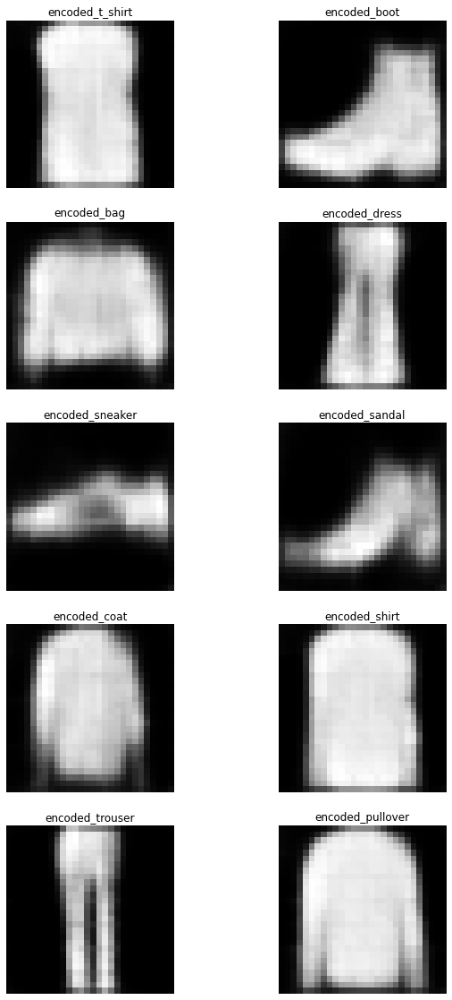

In [86]:
# We take a sample for each encoded class


fig, axs = plt.subplots(5, 2, figsize = (10, 20))
for i, ax in enumerate(axs.flatten()):
    encoded_value = torch.tensor(inverse_encode[i]).float().unsqueeze(0)

    # Decode sample
    decoder_final.eval()
    with torch.no_grad():
        generated_img  = decoder_final(encoded_value)

    
    ax.imshow(generated_img.squeeze().numpy(), cmap='gist_gray')
    ax.set_title(list(encoded_samples.keys())[i])
    ax.axis('off')
   

## ICA

In [99]:
transformer = FastICA(n_components=3,
         random_state=123, whiten='unit-variance')

encoded_samples_reduced_ICA = transformer.fit_transform(encoed_df.iloc[:,:-2])

In [100]:
encoded_samples_reduced_ICA = \
    pd.DataFrame(encoded_samples_reduced_ICA, columns=['Variable_1', 'Variable_2', 'Variable_3'])

encoded_samples_reduced_ICA['Label_name'] = encoed_df['Label_name']
encoded_samples_reduced_ICA.head()

,Variable_1,Variable_2,Variable_3,Label_name
0,0.508297,-0.602474,-1.349975,boot
1,-1.801661,0.829885,0.236866,pullover
2,1.149209,0.187731,1.297160,trouser
3,1.495158,-0.055279,0.953920,trouser
4,-0.349731,0.255227,-0.005745,shirt


In [101]:
fig = px.scatter_3d(encoded_samples_reduced_ICA, x='Variable_1', y='Variable_2', z='Variable_3',
              color='Label_name', title=  'Latent space',labels={
                     "Variable_1": "Variable 1",
                     "Variable_2": "Variable 2",
                     "Variable_3": "Variable 3"
                 },)

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    legend_title_font_color="green",
    
    title={
        'text': "Latent space",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig['layout']['title']['font'] = dict(size=25)

fig.show()

In [102]:
encoded_samples = dict(
encoded_t_shirt = [-0.88, 0.83, 1.31],
encoded_boot = [-0.89, -3.16, -1.22],
encoded_bag = [-1.41, 1.05, -1.47],
encoded_dress =[1.17, -1.18, 1.32],
encoded_sneaker = [0.80, 1.47, -1.52],
encoded_sandal = [0.75, -1.28, -0.94],
encoded_coat = [-0.82, 1.79, 0.50],
encoded_shirt = [-1.09, -0.69, 1.79],
encoded_trouser = [1.36, 0.30, 1.37] ,
encoded_pullover = [-1.71, 1.34, 0.68])

labels = list(map(lambda x: re.findall('_[a-z]_*[a-z]+',x)[0].replace('_',''), list(encoded_samples.keys())))


In [103]:
inverse_encode_ica = transformer.inverse_transform(np.array(list(encoded_samples.values())))


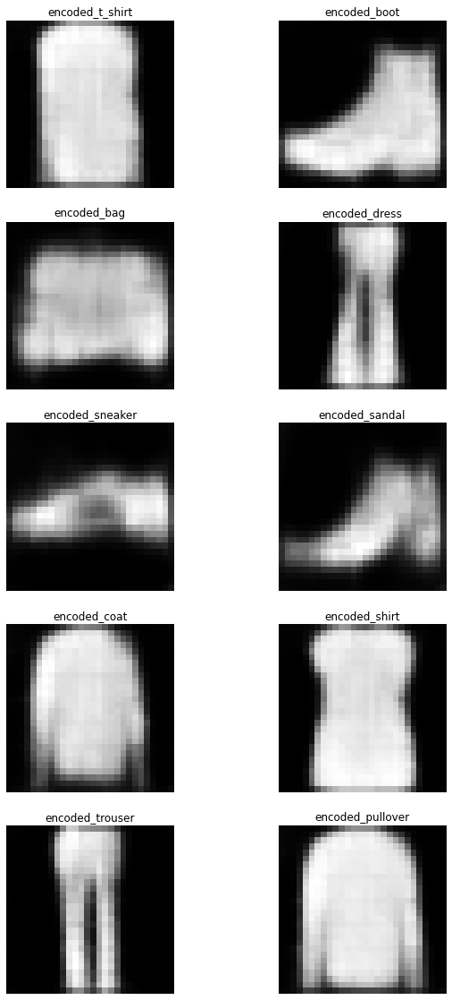

In [104]:
# We take a sample for each encoded class


fig, axs = plt.subplots(5, 2, figsize = (10, 20))
for i, ax in enumerate(axs.flatten()):
    encoded_value = torch.tensor(inverse_encode_ica[i]).float().unsqueeze(0)

    # Decode sample
    decoder_final.eval()
    with torch.no_grad():
        generated_img  = decoder_final(encoded_value)

    
    ax.imshow(generated_img.squeeze().numpy(), cmap='gist_gray')
    ax.set_title(list(encoded_samples.keys())[i])
    ax.axis('off')
   

## Tsne

In [29]:
tsne = pd.read_csv('tsne.csv')
tsne['Label_name'] = encoed_df['Label_name']

In [28]:
tsne.head()


,Variable_1,Variable_2,Variable_3
0,-10.924323,0.408795,-3.537831
1,20.996023,9.047804,5.479970
2,14.192184,-8.669784,13.790290
3,0.606622,-12.332532,18.008894
4,0.506397,4.022285,13.874212


In [30]:
fig = px.scatter_3d(tsne, x='Variable_1', y='Variable_2', z='Variable_3',
              color='Label_name', title=  'Latent space',labels={
                     "Variable_1": "Variable 1",
                     "Variable_2": "Variable 2",
                     "Variable_3": "Variable 3"
                 },)

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    legend_title_font_color="green",
    
    title={
        'text': "Latent space",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig['layout']['title']['font'] = dict(size=25)

fig.show()

## Final tuning

In this new section what we do is to fine tune the encoder trained in the above in order to make it a classifier. <br>
The architecture though has been slightly changed, the classifier indeed has 10 classes as targets while our encoder has a latent space vector of only 9 neurons. What we do is to modify the feed-forward part of our encoder making the the last layer a linear one with 10 output neurons.<br>

To keep our procedure only a fine tuning we block the update of all the layers except the feed-forward ones, this way the optimizer will not change the value of the weights learned when the network was working as an encoder.<br>
We train the classifier the same number of epochs as in homework 1, that is 40 epochs. What we have to notice though is that this time the net will see more data then in homework 1 as in this case the augmentation dataset has been concatenated to the initial training one.<br>
The training and testing function used for each epoch are the same used in homework 1.

In [33]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in encoder_final.named_parameters():
    param.requires_grad = False  

In [35]:
# Change the last layer to match the new reduced problem    
num_classes = 10
encoder_final.encoder_lin[2] = torch.nn.Linear(in_features=64, out_features = num_classes)
print(encoder_final)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU()
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=64, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=64, out_features=10, bias=True)
  )
)


In [36]:
# Allow the training of the last two layers (classifier[4] and classifier[6])
for param in encoder_final.encoder_lin[0].parameters():
    param.requires_grad = True 
for param in encoder_final.encoder_lin[2].parameters():
    param.requires_grad = True 

In [37]:
# Check if correct
for param_name, param in encoder_final.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.weight 	- requires_grad=True
encoder_lin.0.bias 	- requires_grad=True
encoder_lin.2.weight 	- requires_grad=True
encoder_lin.2.bias 	- requires_grad=True


In [39]:
### Training function
def train_epoch(net, dataloader, loss_fn, optimizer_, weight_decay, lr):
    # Set train mode
    net.train()
    for image_batch, label_batch in dataloader:
        
        
        if optimizer_ == 'Adam':
            optimizer = optim.Adam(net.parameters(), lr=lr, weight_decay = weight_decay)
        elif optimizer_ == 'RMSprop':
            optimizer = optim.RMSprop(net.parameters(), lr=lr, weight_decay = weight_decay)

        elif optimizer_ == 'SGD_with_momentum':
            optimizer = optim.SGD(net.parameters(), lr=lr, momentum = 0.9, weight_decay = weight_decay)
        # Forward pass
        out = net(image_batch)
        # Evaluate loss
        loss = loss_fn(out, label_batch)
        # Backward pass and update
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print loss
        print('\t Training loss (single batch):', float(loss.data))

In [40]:
### Testing function
def test_epoch(net, dataloader, loss_fn):
    # Set evaluation mode
    net.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, label_batch in dataloader:
            
            
            # Forward pass
            out = net(image_batch)
            # Append the network output and the original image to the lists
            conc_out.append(out)
            conc_label.append(label_batch)
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return conc_out, conc_label, val_loss.data # We return all the outputs, all the labels and the global loss

In [66]:
train_dataloader = DataLoader(dataset=final_train, batch_size=256, shuffle=True)
test_dataloader  = DataLoader(dataset=test_dataset,  batch_size=len(test_dataset),  shuffle=False)

In [73]:
encoder_final

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU()
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=64, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=64, out_features=10, bias=True)
  )
)

In [78]:
# Train batch
image_batch, label_batch = next(iter(train_dataloader))
print(f"\nTrain input batch shape: {image_batch.shape}")
print(f"Train label batch shape: {label_batch.shape}")
# Trying the one hot conversion
print('First label =', label_batch[0])


# Test batch
image_batch, label_batch = next(iter(test_dataloader))
print(f"\nTest input batch shape: {image_batch.shape}")
print(f"Test label batch shape: {label_batch.shape}")


Train input batch shape: torch.Size([256, 1, 28, 28])
Train label batch shape: torch.Size([256])
First label = tensor(6)

Test input batch shape: torch.Size([1, 1, 28, 28])
Test label batch shape: torch.Size([1])


In [81]:
loss_fn = nn.CrossEntropyLoss()

In [82]:
### Training cycle
num_epochs = 40




train_losses = {}
test_losses = {}


for epoch in range(num_epochs):
    
    print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_epoch(
        net=encoder_final, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer_='Adam', 
        weight_decay=0.0001, 
        lr=0.0001)
    
    ### Train loss (use the TESTING function! We want the train loss but using the network in eval mode and without random transformations)
    # NOTE: understand why we are doing this!
    _, _, train_loss = test_epoch(
        net=encoder_final, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn)
    # Print Train loss
    print(f"\n\n\t TRAIN - EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss}\n\n")
    train_losses[f'epoch_{epoch}'] =train_loss

    ### Validation  (use the testing function)
    conc_out, conc_label, test_loss = test_epoch(
        net=encoder_final, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)
    # Print Validation loss
    print(f"\n\n\t VALIDATION - EPOCH {epoch + 1}/{num_epochs} - val loss: {test_loss}\n\n")
    test_losses[f'epoch_{epoch}'] = test_loss


    

EPOCH 1/40
	 Training loss (single batch): 2.3138210773468018
	 Training loss (single batch): 2.3084003925323486
	 Training loss (single batch): 2.3003716468811035
	 Training loss (single batch): 2.307896137237549
	 Training loss (single batch): 2.3082993030548096
	 Training loss (single batch): 2.299015760421753
	 Training loss (single batch): 2.2978456020355225
	 Training loss (single batch): 2.3017115592956543
	 Training loss (single batch): 2.3031251430511475
	 Training loss (single batch): 2.297983169555664
	 Training loss (single batch): 2.2986490726470947
	 Training loss (single batch): 2.301419496536255
	 Training loss (single batch): 2.3036584854125977
	 Training loss (single batch): 2.3040332794189453
	 Training loss (single batch): 2.3086628913879395
	 Training loss (single batch): 2.3056485652923584
	 Training loss (single batch): 2.305659294128418
	 Training loss (single batch): 2.301466703414917
	 Training loss (single batch): 2.3072946071624756
	 Training loss (single ba

## Results

In 40 epochs the network achieves a validation loss of $0.83$, worse then the $0.64$ we obtained in homework 1.<br>
What we notice is that, contrary to homework 1, the training loss isn't lower then the test one, moreover the two curves are far more stable.

It is true that the "converted encoder" performes worse but it is important to consider that, having to update only a small percentage of the weights, the learning speed is much faster as the average learning epoch's duration lowers from $45.7$ seconds to $36.1$ seconds.<br>
We also computed the accuracy, that lowers in this case form $\approx$ $77$% to $\approx$ $71$%. From plotting the confusion matrix we can see how it has similar properties with the one in homework 1 that is the most mistakes are made between visually similar classes like pullover and shirt.


<center>

|                                        | Original model [s] | Fine tuning model [s] |
|:--------------------------------------:|:--------------------:|:---------------------:|
| **Average training epoch's duration** |        45.7        |         36.1          |

</center>

In [83]:
train_log = list(map(lambda x:float(x.numpy()), list(train_losses.values())))
test_log = list(map(lambda x:float(x.numpy()), list(test_losses.values())))

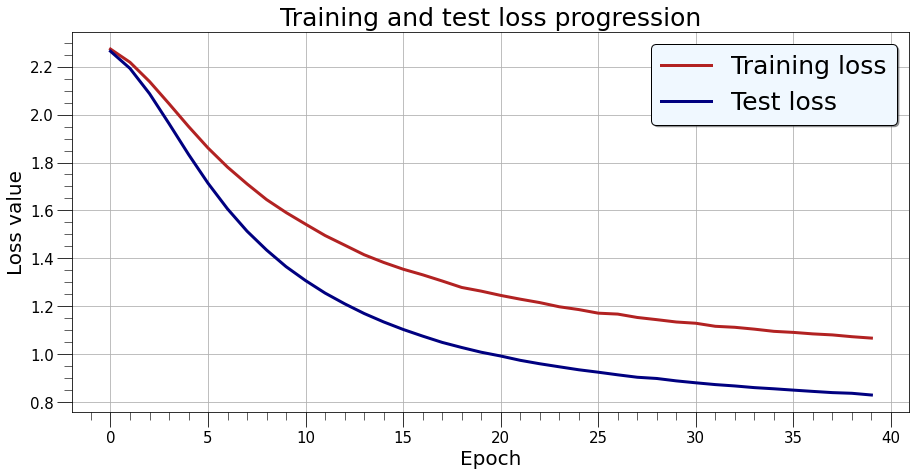

In [84]:
fig, ax = plt.subplots(1, 1, figsize = (15, 7))
ax.plot(train_log, color = 'firebrick', linewidth=3, label='Training loss')
ax.plot(test_log, color = 'navy', linewidth=3, label='Test loss')
ax.minorticks_on()
ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.set_xlabel('Epoch', fontsize = 20)
ax.set_ylabel('Loss value', fontsize = 20)
ax.set_title('Training and test loss progression', fontsize = 25)
ax.legend(facecolor = 'aliceblue', shadow = True, edgecolor = 'black', fontsize = 25)
ax.grid()
plt.show()

In [85]:
y_true = conc_label.data.numpy()
y_pred = conc_out.argmax(dim=1).numpy()
y_diff = y_true - y_pred

In [86]:
print('The accuracy of the model is:', len(y_diff[y_diff == 0])/len(y_diff))

The accuracy of the model is: 0.7118


In [87]:
from sklearn import metrics
cm = metrics.confusion_matrix(y_true, y_pred)
label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']

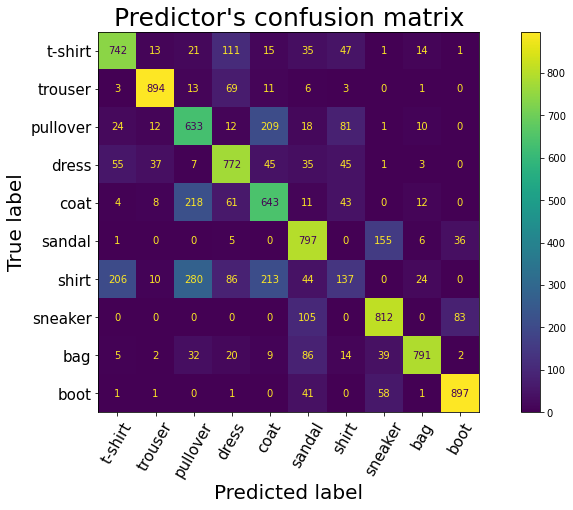

In [88]:
fig, ax = plt.subplots(1, 1, figsize = (15, 7))
disp = metrics.ConfusionMatrixDisplay(cm, display_labels=label_names)
disp.plot(ax = ax)
ax.set_ylabel('True label', fontsize = 20)
ax.set_xlabel('Predicted label', fontsize = 20)
ax.set_xticklabels(labels =label_names, rotation = 60, fontsize = 15)
ax.set_yticklabels(labels =label_names, fontsize = 15)
ax.set_title('Predictor\'s confusion matrix', fontsize = 25)
plt.show()

## GAN

In the last section of this notebook we implement a Generative Adversarial Network (**GAN**), it is actually a **DCGAN**: an extenction of a standard **GAN** where we expliciy use convolutional layers in the discriminator and convolutional-transpose layers in the generator.<br>
The network implemented is a modified version of the **DCGAN** [PyTorch example](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) that implements the [Radford et. al.](https://arxiv.org/pdf/1511.06434.pdf) network.

We have a discriminator composed by convolutional, batch norm layers with a LeakyReLU activation function. The generator is not completely symmetrical as we use **ReLU** as an activation function and obviously we have convolutional transpose layers instead of convolutional ones.<br>
The input to the generator is a fixed-size length vector of size `nz = 50`, drawn from a standard normal distribution. The discriminator on the other end outputs the scalar probability, computed thanks to the **Sigmoid** function, that the image is real or fake.<br>
Both stride and padding are applied to the convolutional and convolutional transpose layers, the [Radford et. al.](https://arxiv.org/pdf/1511.06434.pdf) worked with 3x64x64 images, to adjust to our 1x28x28 MNIST data we tuned the hyper-parameters of the layers accordingly using the well known formulas,
$$
ouput\_size = \frac{input\_size + 2\cdot padding - (kernel\_size -1) - 1}{stride} + 1
$$
for a convolutional layer and,
$$
ouput\_size = (input\_size - 1)\cdot stride - 2\cdot padding + (kernel\_size - 1) + 1
$$
for a transpose concolutional layer.

We don't leave the weight's initialization to be random but, as suggested by the paper we randomly initialize them from a Normal distribution with $mean = 0$, $std\_dev=0.02$.

As far as the loss is concerned we use the Binary Cross Entropy (**BCE**) loss that computes both the $log(D(x))$ and the $log(1-D(G(z)))$ terms, useful for the training of our **GAN** and that will be selectively evaluated each time. In order to help and do all this we label the real images with 1 and the fake images with 0.

During the training loop in which in its first part we will update the discriminator and in the second the generator, a fixed latent vector will be put trough the generator to show the learning progression of the network.


In [141]:
batch_size = 128
image_size = 28
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 50

# Size of feature maps in generator
ngf = 32

# Size of feature maps in discriminator
ndf = 32

# Number of training epochs
num_epochs = 10

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

In [142]:
gan_dataloader = DataLoader(final_train, batch_size = batch_size, shuffle = True)

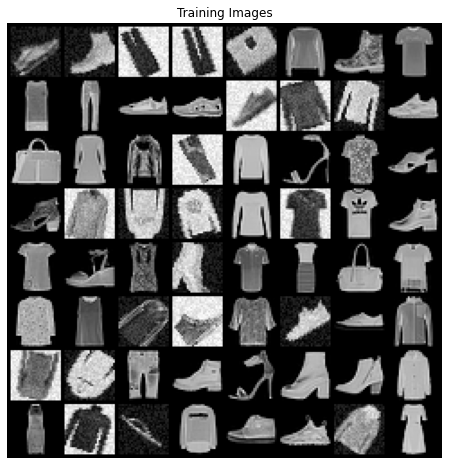

In [143]:
real_batch = next(iter(gan_dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0][:64], padding=2, normalize=True),(1,2,0)))
plt.show()

In [144]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [145]:
# Generator Code

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(in_channels =  nz,out_channels= ngf * 4, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(num_features =ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(in_channels =ngf * 4, out_channels=ngf * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features =ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(in_channels = ngf * 2,out_channels= ngf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features =ngf),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(in_channels = ngf, out_channels= nc, kernel_size=4, stride=2, padding=3, bias=False),
            nn.Tanh()
            # state size. (nc) x 28 x 28
        )

    def forward(self, input):
        return self.main(input)

In [146]:
netG = Generator()
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(50, 128, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(32, 1, kernel_size=(4, 4), stride=(2, 2), padding=(3, 3), bias=False)
    (10): Tanh()
  )
)


In [147]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 28 x 28
            nn.Conv2d(in_channels =nc,out_channels = ndf , kernel_size = 4, stride =2, padding=3, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 16 x 16
            nn.Conv2d(in_channels =ndf, out_channels =ndf * 2, kernel_size =4, stride =2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 8
            nn.Conv2d(in_channels = ndf * 2, out_channels =ndf * 4, kernel_size =4, stride =2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 4 x 4
            nn.Conv2d(in_channels =ndf * 4, out_channels =1, kernel_size =4, stride =1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [148]:
netD = Discriminator()

netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(128, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (10): Sigmoid()
  )
)


In [149]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(size = (28, nz, 1, 1))

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [150]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
D_values = []
G_values = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(gan_dataloader, start = 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0]
        b_size = real_cpu.size(0)
        label = torch.full(size = (b_size,), fill_value = real_label, dtype=torch.float)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(size = (b_size, nz, 1, 1))
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch + 1, num_epochs, i, len(gan_dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            D_values.append(D_x)
            G_values.append(D_G_z2)
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(gan_dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))

        iters += 1



Starting Training Loop...
[1/10][0/563]	Loss_D: 1.3956	Loss_G: 0.9182	D(x): 0.6507	D(G(z)): 0.5924 / 0.4196
[1/10][50/563]	Loss_D: 0.6650	Loss_G: 2.7262	D(x): 0.7675	D(G(z)): 0.2921 / 0.0845
[1/10][100/563]	Loss_D: 0.6085	Loss_G: 2.2914	D(x): 0.7212	D(G(z)): 0.2010 / 0.1174
[1/10][150/563]	Loss_D: 0.8077	Loss_G: 1.7375	D(x): 0.6750	D(G(z)): 0.2975 / 0.1987
[1/10][200/563]	Loss_D: 0.5612	Loss_G: 2.4817	D(x): 0.8679	D(G(z)): 0.3166 / 0.1056
[1/10][250/563]	Loss_D: 0.6801	Loss_G: 2.5741	D(x): 0.8478	D(G(z)): 0.3732 / 0.0967
[1/10][300/563]	Loss_D: 0.6153	Loss_G: 2.2543	D(x): 0.8137	D(G(z)): 0.2946 / 0.1367
[1/10][350/563]	Loss_D: 0.5299	Loss_G: 2.7307	D(x): 0.8846	D(G(z)): 0.3080 / 0.0841
[1/10][400/563]	Loss_D: 0.4481	Loss_G: 2.2292	D(x): 0.7746	D(G(z)): 0.1523 / 0.1329
[1/10][450/563]	Loss_D: 0.9093	Loss_G: 0.8690	D(x): 0.5126	D(G(z)): 0.0755 / 0.4643
[1/10][500/563]	Loss_D: 0.3789	Loss_G: 2.2397	D(x): 0.8388	D(G(z)): 0.1625 / 0.1286
[1/10][550/563]	Loss_D: 0.4702	Loss_G: 2.1170	D(x): 0

### Generator and discriminator loss
We plot below the generator and the discriminator loss, what we see here is that they are both very unstable, if we look closely we can also spot **GAN**'s typical behaviour with the generator's loss decreasing a bit and then increasing and viceversa for the discriminator's loss.

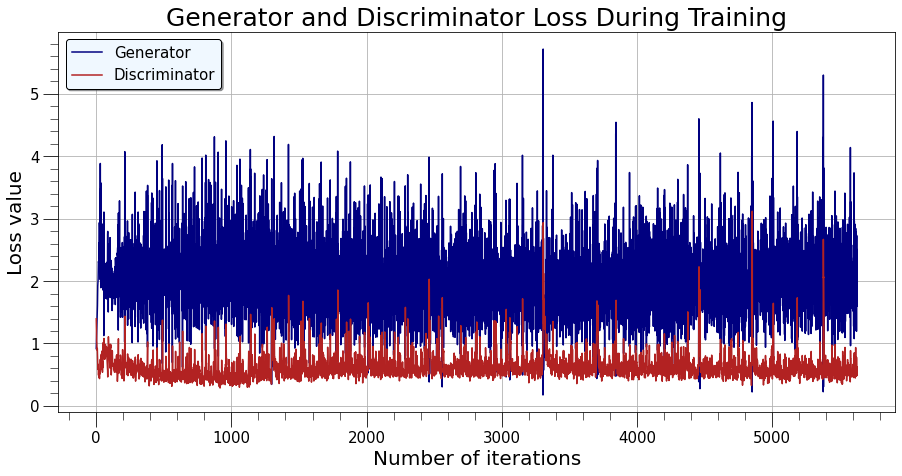

In [151]:
fig, ax = plt.subplots(1, 1, figsize = (15, 7))
ax.set_title("Generator and Discriminator Loss During Training", fontsize = 25)
ax.plot(G_losses,label="Generator", color = 'navy')
ax.plot(D_losses,label="Discriminator", color = 'firebrick')
ax.set_xlabel("Number of iterations", fontsize = 20)
ax.set_ylabel("Loss value", fontsize = 20)
ax.legend(facecolor = 'aliceblue', fontsize = 15, shadow = True, edgecolor = 'black')
ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.grid()
ax.minorticks_on()
plt.show()

### Generator and discriminator average output
The generator and discriminator average outputs, that ideally should both converge to $0.5$ display instability even tough they have the correct relationship with the generator staying lower and the dicriminator being higher.

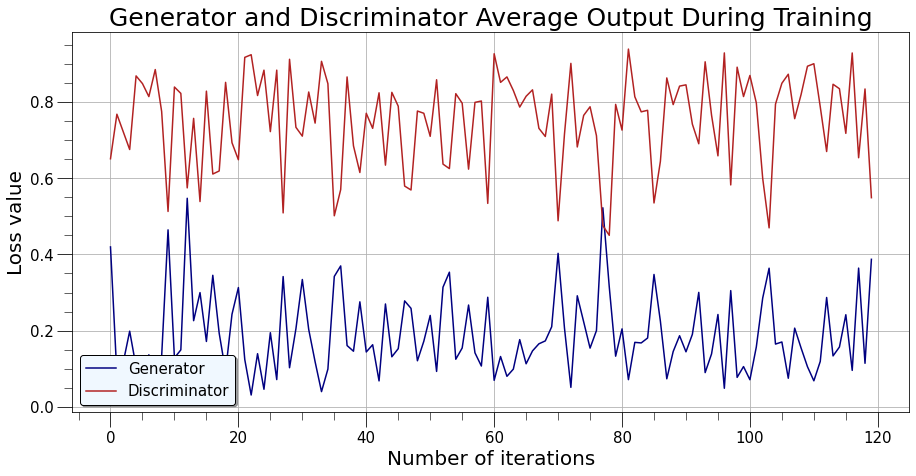

In [154]:
fig, ax = plt.subplots(1, 1, figsize = (15, 7))
ax.set_title("Generator and Discriminator Average Output During Training", fontsize = 25)
ax.plot(G_values,label="Generator", color = 'navy')
ax.plot(D_values,label="Discriminator", color = 'firebrick')
ax.set_xlabel("Number of iterations", fontsize = 20)
ax.set_ylabel("Loss value", fontsize = 20)
ax.legend(facecolor = 'aliceblue', fontsize = 15, shadow = True, edgecolor = 'black', loc = 'lower left')
ax.tick_params(axis='both', which='major', labelsize=15, length=15)
ax.tick_params(axis='both', which='minor', labelsize=15, length=8)
ax.grid()
ax.minorticks_on()
plt.show()

### Learning progression
We show below the learning progression of the generator, as we can see the net starts with basically random noise and then, little by little, the objects of the different classes become reognizable.

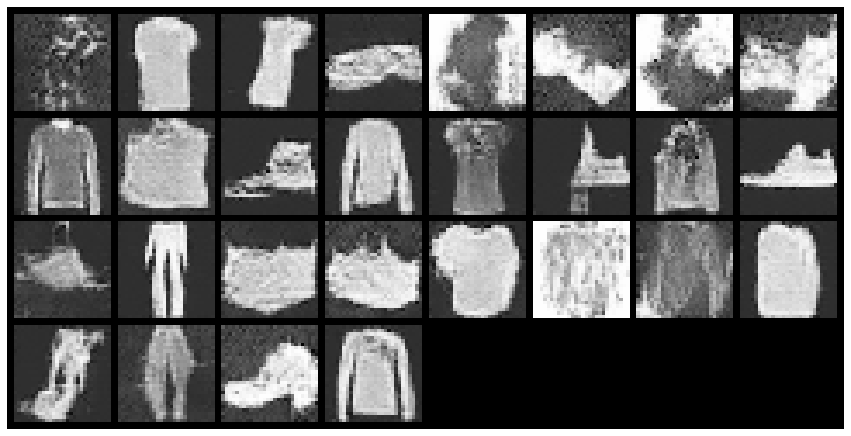

In [155]:
fig = plt.figure(figsize=(15,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True, cmap='gray')] for i in img_list]

ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())



### Side by side comparison

Finally we show some side by side comparison between real and fake images. We can certainly spot some criticality with samples that can be easily labelled as fake by the human eye. On the other hand some generated images represent quite well instances of the original data.

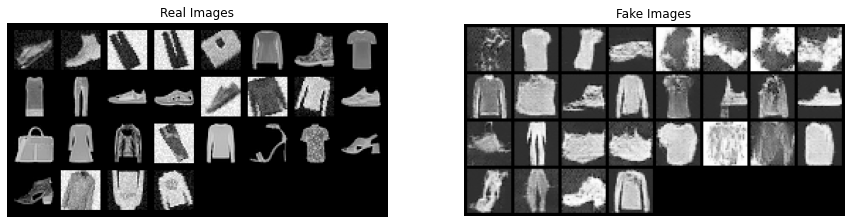

In [156]:
# Grab a batch of real images from the dataloader


# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0][:28], padding=5, normalize=True),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()